In [1]:
!nvidia-smi

Tue Sep 30 23:23:55 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Installations

In [2]:
# !pip install split-folders

# Imports

In [2]:
import random
# import splitfolders
import os
import json
import shutil
from pathlib import Path
from typing import Optional, List, Union, Tuple, Dict

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms, datasets, utils
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support

2025-09-30 23:24:12.989672: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1759274653.335691      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1759274653.436864      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Set seed for deterministic results

In [3]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)


# Dataset Preparation

## Fetching Dataset

In [ ]:
!#!/bin/bash
# !curl -L -o ./five-crop-diseases-dataset.zip\
#   https://www.kaggle.com/api/v1/datasets/download/shubham2703/five-crop-diseases-dataset

In [ ]:
# !unzip -q /content/five-crop-diseases-dataset.zip -d /content/

In [ ]:
# !rm -rf "/content/Crop Diseases Dataset"
# !rm -rf /content/dataset

## Extract and restructure

In [ ]:
# !mkdir Data

# !mv "/content/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Corn/"* /content/Data/
# !mv "/content/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Potato/"* /content/Data/
# !mv "/content/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Wheat/"* /content/Data/
# !mv "/content/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Rice/"* /content/Data/
# !mv "/content/Crop Diseases Dataset/Crop Diseases/Crop___Disease/sugarcane/"* /content/Data/

# !rm -rf "/content/Crop Diseases Dataset"

In [ ]:
!mkdir Data

In [5]:
!pwd

/kaggle/working


In [ ]:
# !mkdir Data

# !cp -R "/kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Corn/"* Data/
# !cp -R "/kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Potato/"* Data/
# !cp -R "/kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Wheat/"* Data/
# !cp -R "/kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/Rice/"* Data/  
# !cp -R "/kaggle/input/five-crop-diseases-dataset/Crop Diseases Dataset/Crop Diseases/Crop___Disease/sugarcane/"* Data/

# !rm -rf "/content/Crop Diseases Dataset"

In [5]:
!find /kaggle/input -type f | wc -l

13325


In [6]:
!find Data -type f | wc -l

find: ‘Data’: No such file or directory
0


## Train-Val-Test Split

In [ ]:
# !rm -rf dataset
# splitfolders.ratio("Data", output="dataset",
#     seed=1337, ratio=(.8, .1, .1), group_prefix=None, move=False)
# move =True if you need to move instead of copy.

In [9]:
!find dataset -type f | wc -l

13324


In [ ]:
import os

def rename_folders(base_dir):
    """
    Renames specific folders within train, val, and test directories
    by adding a 'Sugarcane_' prefix.
    """
    if not os.path.isdir(base_dir):
        raise ValueError(f"Base directory '{base_dir}' does not exist.")

    # Define the splits (subdirectories) to process
    splits = ["train", "val", "test"]
    
    # Define the folder names to be changed
    folders_to_rename = ["Healthy", "Bacterial Blight", "Red Rot"]
    
    # Loop through each split (train, val, test)
    for split in splits:
        split_path = os.path.join(base_dir, split)
        
        # Check if the split directory (e.g., 'dataset/train') exists
        if not os.path.isdir(split_path):
            continue
            
        print(f"Processing directory: {split_path}")
        
        # Loop through each folder name we want to rename
        for folder_name in folders_to_rename:
            old_path = os.path.join(split_path, folder_name)
            new_name = f"Sugarcane__{folder_name}"
            new_path = os.path.join(split_path, new_name)
            
            # Check if the source folder (e.g., 'dataset/train/Health') exists
            if os.path.isdir(old_path):
                try:
                    os.rename(old_path, new_path)
                    print(f"  - Renamed '{folder_name}' to '{new_name}'")
                except OSError as e:
                    print(f"  - Error renaming '{folder_name}': {e}")

    print("\nRenaming complete.")

rename_folders('dataset')

# Data Loading and Augmentation

In [4]:
data_dir = "dataset"
img_size = 224
batch_size = 128
num_workers = os.cpu_count()
print(num_workers)

4


In [7]:
# Transforms
train_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomAdjustSharpness(sharpness_factor=2),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=(0, 180)),
    transforms.GaussianBlur(kernel_size=(3, 5), sigma=(0.1, 5.)),
    transforms.RandomPerspective(distortion_scale=0.2, p=1.0),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# Datasets
train_dataset = datasets.ImageFolder(root=f"{data_dir}/train", transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=f"{data_dir}/val", transform=val_test_transforms)
test_dataset  = datasets.ImageFolder(root=f"{data_dir}/test", transform=val_test_transforms)

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True, persistent_workers=True, prefetch_factor=4)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True, persistent_workers=True, prefetch_factor=4)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True, persistent_workers=True, prefetch_factor=4)


print("Classes:", train_dataset.classes)
print("Train size:", len(train_dataset))
print("Val size:", len(val_dataset))
print("Test size:", len(test_dataset))

Classes: ['Corn___Common_Rust', 'Corn___Gray_Leaf_Spot', 'Corn___Healthy', 'Corn___Northern_Leaf_Blight', 'Potato___Early_Blight', 'Potato___Healthy', 'Potato___Late_Blight', 'Rice___Brown_Spot', 'Rice___Healthy', 'Rice___Leaf_Blast', 'Rice___Neck_Blast', 'Sugarcane__Bacterial Blight', 'Sugarcane__Healthy', 'Sugarcane__Red Rot', 'Wheat___Brown_Rust', 'Wheat___Healthy', 'Wheat___Yellow_Rust']
Train size: 10654
Val size: 1328
Test size: 1342


# Defining Model Architecture and Params

In [9]:
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)
# or any of these variants
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet34', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet101', pretrained=True)
# model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet152', pretrained=True)

# model = torch.load("/content/drive/MyDrive/Agri_best.pth", weights_only=False)
_ = model.eval()

# count the number  of trainable parameters
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {num_params}")

Downloading: "https://github.com/pytorch/vision/zipball/v0.10.0" to /root/.cache/torch/hub/v0.10.0.zip
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 162MB/s] 


Number of trainable parameters: 11689512


In [10]:
for param in model.parameters():
    param.requires_grad = False

# Unfreeze last convolutional block
for param in model.layer4.parameters():
    param.requires_grad = True
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {num_params}")

Number of trainable parameters: 8393728


In [11]:
num_classes = len(train_dataset.classes)
in_features = model.fc.in_features
model.fc = nn.Linear(in_features, num_classes)  # Replace last layer
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {num_params}")

Number of trainable parameters: 8402449


# Training

In [5]:
torch.cuda.empty_cache()

In [14]:
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
import itertools
import seaborn as sns
import torch.optim.lr_scheduler as lr_scheduler


class Trainer:
    def __init__(
            self,
            model,
            train_loader,
            val_loader,
            device,
            lr=1e-3,
            patience=5,
            scheduler_type="step",
            gamma=0.01,
            step_size=30,
            log_dir="runs/exp1",
            best_path='Kaggle_Agri_best.pth'
        ):
        self.model = model.to(device)
        if torch.cuda.device_count() > 1:
            print(f"Using {torch.cuda.device_count()} GPUs with DataParallel")
            self.model = nn.DataParallel(self.model)
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.device = device

        self.criterion = nn.CrossEntropyLoss()
        trainable_params = filter(lambda p: p.requires_grad, model.parameters())
        self.optimizer = optim.Adam(trainable_params, lr=lr)
        self.writer = SummaryWriter(log_dir=log_dir)

        self.best_loss = float("inf")
        self.best_path = best_path
        self.last_path = best_path.replace('best', 'last')
        self.patience = patience
        self.no_improvement = 1

        # Choose scheduler
        if scheduler_type == "step":
            self.scheduler = lr_scheduler.StepLR(self.optimizer, step_size=step_size, gamma=gamma)
        elif scheduler_type == "plateau":
            self.scheduler = lr_scheduler.ReduceLROnPlateau(self.optimizer, mode="min", patience=3, factor=gamma)
        else:
            self.scheduler = None

    def train(self, epochs):
        for epoch in range(epochs):
            # Training loop
            self.model.train()
            train_loss, correct, total = 0, 0, 0

            loop = tqdm(self.train_loader, desc=f"Epoch [{epoch+1}/{epochs}]")
            for images, labels in loop:
                images, labels = images.to(self.device), labels.to(self.device)

                outputs = self.model(images)
                loss = self.criterion(outputs, labels)

                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()

                train_loss += loss.item() * images.size(0)
                _, preds = outputs.max(1)
                correct += preds.eq(labels).sum().item()
                total += labels.size(0)

                loop.set_postfix(loss=loss.item(), acc=100. * correct / total)

            epoch_loss = train_loss / total
            epoch_acc = 100. * correct / total
            self.writer.add_scalar("Loss/train", epoch_loss, epoch)
            self.writer.add_scalar("Accuracy/train", epoch_acc, epoch)

            # Validation loop
            val_loss = self.validate(epoch)

            if val_loss == -1:
                break
            if self.scheduler:
                if isinstance(self.scheduler, lr_scheduler.ReduceLROnPlateau):
                    self.scheduler.step(val_loss)  # pass monitored metric
                else:
                    self.scheduler.step()


    def validate(self, epoch):
        self.model.eval()
        val_loss, correct, total = 0, 0, 0

        with torch.no_grad():
            for images, labels in self.val_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self.model(images)
                loss = self.criterion(outputs, labels)

                val_loss += loss.item() * images.size(0)
                _, preds = outputs.max(1)
                correct += preds.eq(labels).sum().item()
                total += labels.size(0)

        if val_loss < self.best_loss:
            self.best_loss = val_loss
            if torch.cuda.device_count() > 1:
                torch.save(self.model.module, self.best_path)
            else:
                torch.save(model, self.best_path)
            print(f"Model Saved at {self.best_path}")
            self.no_improvement = 1 # reset the patience
        else:
            self.no_improvement += 1
            if self.no_improvement >= self.patience:
                print("Validation Loss did not improve for last 5 epochs!")
                print("Early stopping triggered!!!")
                return -1

        val_loss /= total
        val_acc = 100. * correct / total
        print(f"Validation: Loss={val_loss:.4f}, Acc={val_acc:.2f}%")

        self.writer.add_scalar("Loss/val", val_loss, epoch)
        self.writer.add_scalar("Accuracy/val", val_acc, epoch)
        return val_loss

    def test(self, test_loader, class_names):
        """Evaluate model on test set, show confusion matrix & sample predictions."""
        self.model.eval()
        correct, total, test_loss = 0, 0, 0
        all_preds, all_labels = [], []

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self.model(images)
                loss = self.criterion(outputs, labels)

                test_loss += loss.item() * images.size(0)
                _, preds = outputs.max(1)
                correct += preds.eq(labels).sum().item()
                total += labels.size(0)

                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        test_loss /= total
        test_acc = 100. * correct / total
        print(f"\nTest: Loss={test_loss:.4f}, Acc={test_acc:.2f}%")

        # Confusion Matrix
        cm = confusion_matrix(all_labels, all_preds)
        fig, ax = plt.subplots(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=class_names, yticklabels=class_names, ax=ax)
        plt.ylabel("True")
        plt.xlabel("Predicted")
        plt.title("Confusion Matrix")
        self.writer.add_figure("ConfusionMatrix", fig)
        plt.close(fig)

        # Show sample correct & incorrect predictions
        self._show_predictions(test_loader, class_names)

    def _show_predictions(self, test_loader, class_names, num_images=5):
        """Print some correct and incorrect predictions with images."""
        self.model.eval()
        shown_correct, shown_incorrect = 0, 0

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self.model(images)
                _, preds = outputs.max(1)

                for i in range(len(labels)):
                    if preds[i] == labels[i] and shown_correct < num_images:
                        print(f"Correct: {class_names[labels[i]]}")
                        self._plot_image(images[i], class_names[preds[i]])
                        shown_correct += 1
                    elif preds[i] != labels[i] and shown_incorrect < num_images:
                        print(f"Wrong: Pred={class_names[preds[i]]}, True={class_names[labels[i]]}")
                        self._plot_image(images[i], f"P:{class_names[preds[i]]} | T:{class_names[labels[i]]}")
                        shown_incorrect += 1

                    if shown_correct >= num_images and shown_incorrect >= num_images:
                        return

    def _plot_image(self, tensor_img, title):
        """Helper: plot a single image tensor."""
        img = tensor_img.cpu().permute(1, 2, 0).numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean  # de-normalize
        img = np.clip(img, 0, 1)

        plt.imshow(img)
        plt.title(title)
        plt.axis("off")
        plt.show()


## Configs

In [14]:
epochs = 50
lr = 1e-3
model_name = "resnet18_finetune"

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


## Tensorboard for Visualization of training

In [ ]:
# %load_ext tensorboard
# # !kill $(lsof -i:6006 -t) 2> /dev/null
# %tensorboard --logdir runs --host 0.0.0.0 --port 6006

In [15]:
import gc
# empty caches
torch.cuda.empty_cache()
gc.collect()

0

# Training

In [16]:
# Trainer
trainer = Trainer(
    model, train_loader, val_loader, 
    device,
    best_path='Kaggle_ResNet18_Finetune.pth',
    lr=lr, patience=5, log_dir=f"runs/{model_name}")
trainer.train(epochs=epochs)

Using 2 GPUs with DataParallel


Epoch [1/50]: 100%|██████████| 84/84 [02:31<00:00,  1.81s/it, acc=84.6, loss=0.642]


Model Saved at Kaggle_ResNet18_Finetune.pth
Validation: Loss=0.3384, Acc=87.27%


Epoch [2/50]: 100%|██████████| 84/84 [02:27<00:00,  1.75s/it, acc=90.7, loss=0.484]


Model Saved at Kaggle_ResNet18_Finetune.pth
Validation: Loss=0.2614, Acc=90.36%


Epoch [3/50]: 100%|██████████| 84/84 [02:33<00:00,  1.83s/it, acc=91.9, loss=0.232] 


Validation: Loss=0.6181, Acc=83.06%


Epoch [4/50]: 100%|██████████| 84/84 [02:25<00:00,  1.73s/it, acc=92.2, loss=0.208]


Validation: Loss=0.2780, Acc=89.68%


Epoch [5/50]: 100%|██████████| 84/84 [02:25<00:00,  1.74s/it, acc=92.8, loss=0.525] 


Validation: Loss=0.3406, Acc=87.58%


Epoch [6/50]: 100%|██████████| 84/84 [02:20<00:00,  1.68s/it, acc=93.4, loss=0.12]  


Model Saved at Kaggle_ResNet18_Finetune.pth
Validation: Loss=0.2076, Acc=92.32%


Epoch [7/50]: 100%|██████████| 84/84 [02:26<00:00,  1.74s/it, acc=93.6, loss=0.295] 


Validation: Loss=0.2275, Acc=91.27%


Epoch [8/50]: 100%|██████████| 84/84 [02:28<00:00,  1.77s/it, acc=93.6, loss=0.852] 


Validation: Loss=0.3260, Acc=89.98%


Epoch [9/50]: 100%|██████████| 84/84 [02:25<00:00,  1.73s/it, acc=93.6, loss=0.373] 


Validation: Loss=0.2433, Acc=91.79%


Epoch [10/50]: 100%|██████████| 84/84 [02:26<00:00,  1.75s/it, acc=94.3, loss=0.256] 


Validation Loss did not improve for last 5 epochs!
Early stopping triggered!!!


# Model Evaluation

In [22]:
class TestRunner:
    """
    TestRunner evaluates a classification model on a test set (folder or DataLoader),
    plots confusion matrix, sample predictions, most-confident incorrect predictions,
    logs everything to TensorBoard and saves per-experiment CSV/JSON results for later comparison.
    """

    def __init__(
        self,
        model: torch.nn.Module,
        test_dir: Optional[str] = None,
        test_loader: Optional[DataLoader] = None,
        device: Optional[torch.device] = None,
        batch_size: int = 64,
        num_workers: int = 4,
        transform: Optional[transforms.Compose] = None,
        log_dir: str = "runs/test",
        results_dir: str = "results/test",
        criterion: Optional[nn.Module] = None,
    ):
        assert (test_dir is not None) or (test_loader is not None), "Pass either test_dir or test_loader"
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.test_dir = test_dir
        self.test_loader = test_loader
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.log_dir = log_dir
        self.results_dir = results_dir
        self.criterion = criterion or nn.CrossEntropyLoss()
        self.writer = SummaryWriter(log_dir=log_dir)

        # default transforms if not provided
        if transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
            ])
        else:
            self.transform = transform

        os.makedirs(self.results_dir, exist_ok=True)

        # if test_dir given, build DataLoader
        if self.test_loader is None and self.test_dir is not None:
            dataset = datasets.ImageFolder(root=self.test_dir, transform=self.transform)
            self.class_names = dataset.classes
            self.test_loader = DataLoader(dataset, batch_size=self.batch_size,
                                          shuffle=False, num_workers=self.num_workers)
        elif self.test_loader is not None:
            # try to read class names from the dataset if possible
            try:
                self.class_names = self.test_loader.dataset.classes
            except Exception:
                self.class_names = None

        if self.class_names is None:
            # fallback
            self.class_names = [str(i) for i in range(1000)]

    def run(self, num_images_grid: int = 8, topk_incorrect: int = 20, save_csv: bool = True):
        """
        Evaluate the model on the test_loader and produce:
          - overall loss & accuracy
          - per-class precision/recall/f1
          - confusion matrix
          - plot sample correct & incorrect predictions (grid)
          - find most-confident incorrect predictions (high predicted probability but wrong)
          - save results as CSV/JSON
          - log figures to TensorBoard
        """
        self.model.eval()
        total_loss = 0.0
        total_correct = 0
        total_samples = 0

        all_preds = []
        all_labels = []
        all_probs = []  # probability of the predicted class
        all_images = []  # store small subset of images for plotting

        with torch.no_grad():
            loop = tqdm(self.test_loader, desc="Testing")
            for images, labels in loop:
                images = images.to(self.device)
                labels = labels.to(self.device)
                outputs = self.model(images)  # shape (B, C)

                loss = self.criterion(outputs, labels)
                total_loss += loss.item() * images.size(0)

                probs = F.softmax(outputs, dim=1)
                confs, preds = torch.max(probs, dim=1)

                total_correct += preds.eq(labels).sum().item()
                total_samples += labels.size(0)

                all_preds.extend(preds.cpu().numpy().tolist())
                all_labels.extend(labels.cpu().numpy().tolist())
                all_probs.extend(confs.cpu().numpy().tolist())

                # store a few images for visual grid (as CPU tensors, de-normalized later)
                # store up to num_images_grid*2 images
                # if len(all_images) < num_images_grid * 2: # Remove this condition
                all_images.extend(images.cpu())


        avg_loss = total_loss / total_samples
        accuracy = 100.0 * total_correct / total_samples

        # Classification metrics
        precision, recall, f1, support = precision_recall_fscore_support(all_labels, all_preds, zero_division=0)
        class_report = classification_report(all_labels, all_preds, target_names=self.class_names, zero_division=0, output_dict=True)

        # Confusion matrix
        cm = confusion_matrix(all_labels, all_preds)

        # Save base results
        results = {
            "num_samples": int(total_samples),
            "loss": float(avg_loss),
            "accuracy": float(accuracy),
            "per_class": {self.class_names[i]: {
                "precision": float(precision[i]),
                "recall": float(recall[i]),
                "f1": float(f1[i]),
                "support": int(support[i])
            } for i in range(len(self.class_names))}
        }

        # Save json & csv summary
        if save_csv:
            # per-class csv
            perclass_rows = []
            for i, cname in enumerate(self.class_names):
                perclass_rows.append({
                    "class_idx": i,
                    "class_name": cname,
                    "precision": float(precision[i]),
                    "recall": float(recall[i]),
                    "f1": float(f1[i]),
                    "support": int(support[i])
                })
            df_perclass = pd.DataFrame(perclass_rows)
            perclass_csv = os.path.join(self.results_dir, "per_class_metrics.csv")
            df_perclass.to_csv(perclass_csv, index=False)

            # summary csv
            summary_df = pd.DataFrame([{
                "loss": avg_loss,
                "accuracy": accuracy,
                "num_samples": int(total_samples)
            }])
            summary_csv = os.path.join(self.results_dir, "summary.csv")
            summary_df.to_csv(summary_csv, index=False)

            # json
            json_path = os.path.join(self.results_dir, "results.json")
            with open(json_path, "w") as f:
                json.dump(results, f, indent=2)

        # Log scalars to TensorBoard
        self.writer.add_scalar("Test/Loss", avg_loss, 0)
        self.writer.add_scalar("Test/Accuracy", accuracy, 0)

        # Log per-class metrics as text and scalars (macro)
        macro_precision = float(np.nanmean(precision))
        macro_recall = float(np.nanmean(recall))
        macro_f1 = float(np.nanmean(f1))
        self.writer.add_scalar("Test/MacroPrecision", macro_precision, 0)
        self.writer.add_scalar("Test/MacroRecall", macro_recall, 0)
        self.writer.add_scalar("Test/MacroF1", macro_f1, 0)

        # Plot & save confusion matrix figure
        cm_fig = self._plot_confusion_matrix(cm, self.class_names, normalize=False)
        cm_path = os.path.join(self.results_dir, "confusion_matrix.png")
        cm_fig.savefig(cm_path, bbox_inches="tight")
        self.writer.add_figure("ConfusionMatrix", cm_fig)
        plt.close(cm_fig)

        # Plot normalized confusion matrix
        cm_norm_fig = self._plot_confusion_matrix(cm, self.class_names, normalize=True)
        cm_norm_path = os.path.join(self.results_dir, "confusion_matrix_norm.png")
        cm_norm_fig.savefig(cm_norm_path, bbox_inches="tight")
        self.writer.add_figure("ConfusionMatrix_Normalized", cm_norm_fig)
        plt.close(cm_norm_fig)

        # Save a couple of image grids (correct vs incorrect)
        grid_fig = self._plot_prediction_grid(all_images[:num_images_grid], all_labels[:num_images_grid], all_preds[:num_images_grid], self.class_names, num_images=num_images_grid)
        grid_path = os.path.join(self.results_dir, "prediction_grid.png")
        grid_fig.savefig(grid_path, bbox_inches="tight")
        self.writer.add_figure("SamplePredictions", grid_fig)
        plt.close(grid_fig)

        # Find most confident incorrect predictions
        top_incorrect_fig = self._plot_most_confident_incorrects(
            probs=np.array(all_probs),
            preds=np.array(all_preds),
            labels=np.array(all_labels),
            images=all_images,
            class_names=self.class_names,
            topk=topk_incorrect
        )
        if top_incorrect_fig is not None:
            top_incorrect_path = os.path.join(self.results_dir, "most_confident_incorrects.png")
            top_incorrect_fig.savefig(top_incorrect_path, bbox_inches="tight")
            self.writer.add_figure("MostConfidentIncorrects", top_incorrect_fig)
            plt.close(top_incorrect_fig)

        # Save a CSV with overall and per-class metrics for easy aggregation across experiments
        if save_csv:
            out_csv = os.path.join(self.results_dir, "metrics_for_aggregation.csv")
            rows = []
            for i, cname in enumerate(self.class_names):
                rows.append({
                    "experiment": os.path.basename(self.results_dir.rstrip('/')),
                    "class_idx": i,
                    "class_name": cname,
                    "precision": float(precision[i]),
                    "recall": float(recall[i]),
                    "f1": float(f1[i]),
                    "support": int(support[i]),
                    "overall_accuracy": accuracy,
                    "overall_loss": avg_loss
                })
            pd.DataFrame(rows).to_csv(out_csv, index=False)

        print(f"\nTest results saved to {self.results_dir}")
        print(f"Accuracy: {accuracy:.2f}%, Loss: {avg_loss:.4f}")
        return results

    # -------------------------
    # Helper plotting functions
    # -------------------------
    def _plot_confusion_matrix(self, cm: np.ndarray, class_names: List[str], normalize: bool = False):
        """
        Return a matplotlib figure for the confusion matrix.
        """
        fig, ax = plt.subplots(figsize=(8, 6))
        if normalize:
            cm_sum = cm.sum(axis=1)[:, np.newaxis]
            cm_plot = np.divide(cm, cm_sum, where=cm_sum != 0)
            sns.heatmap(cm_plot, annot=True, fmt=".2f", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
            ax.set_title("Normalized Confusion Matrix")
        else:
            sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
            ax.set_title("Confusion Matrix (Counts)")
        ax.set_xlabel("Predicted")
        ax.set_ylabel("True")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        return fig

    def _denormalize(self, tensor_img: torch.Tensor):
        """Convert a normalized image tensor back to [0,1] numpy image for plotting."""
        img = tensor_img.clone()
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        img = img * std + mean
        img = img.clamp(0, 1)
        return img.permute(1, 2, 0).numpy()

    def _plot_prediction_grid(self, all_images: List[torch.Tensor], all_labels: List[int], all_preds: List[int],
                              class_names: List[str], num_images: int = 8):
        """
        Plot a grid of images showing predicted vs true label (a mix of correct + incorrect).
        """
        # Prepare a small selection
        n = min(len(all_images), num_images)
        fig, axes = plt.subplots(1, n, figsize=(n * 3, 3))
        for i in range(n):
            ax = axes[i] if n > 1 else axes
            img = self._denormalize(all_images[i])
            true = class_names[all_labels[i]]
            pred = class_names[all_preds[i]]
            ax.imshow(img)
            ax.set_title(f"T:{true}\nP:{pred}")
            ax.axis("off")
        plt.tight_layout()
        return fig

    def _plot_most_confident_incorrects(self, probs: np.ndarray, preds: np.ndarray, labels: np.ndarray,
                                        images: List[torch.Tensor], class_names: List[str], topk: int = 20):
        """
        Identify incorrect predictions where model was most confident, and plot topk of them.
        probs: predicted class probability for each item (same length as preds)
        """
        incorrect_mask = preds != labels
        if incorrect_mask.sum() == 0:
            print("No incorrect predictions to show.")
            return None

        incorrect_probs = probs[incorrect_mask]
        incorrect_indices = np.where(incorrect_mask)[0]
        # sort by descending predicted probability
        order = np.argsort(-incorrect_probs)
        topk_idx = incorrect_indices[order][:topk]

        n = len(topk_idx)
        cols = 5
        rows = max(1, int(np.ceil(n / cols)))
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        axes = axes.flatten()
        for i, idx in enumerate(topk_idx):
            ax = axes[i]
            img = self._denormalize(images[idx])
            true = class_names[labels[idx]]
            pred = class_names[preds[idx]]
            conf = probs[idx]
            ax.imshow(img)
            ax.set_title(f"P:{pred} ({conf:.2f})\nT:{true}")
            ax.axis("off")
        # hide extra axes
        for j in range(n, len(axes)):
            axes[j].axis("off")
        plt.tight_layout()
        return fig

    # -------------------------
    # Utilities for experiments
    # -------------------------
    @staticmethod
    def compare_runs(results_root: str, out_fig: Optional[str] = None):
        """
        Aggregate all 'metrics_for_aggregation.csv' under results_root
        and create a comparison table/plot for overall accuracy & per-class f1 across experiments.

        results_root: folder containing subfolders for each experiment (each should have metrics_for_aggregation.csv)
        """
        csv_paths = list(Path(results_root).rglob("metrics_for_aggregation.csv"))
        if len(csv_paths) == 0:
            raise FileNotFoundError("No metrics_for_aggregation.csv files found under " + str(results_root))

        dfs = []
        for p in csv_paths:
            df = pd.read_csv(p)
            # add experiment name if missing
            if 'experiment' not in df.columns:
                df['experiment'] = p.parent.name
            dfs.append(df)

        all_df = pd.concat(dfs, ignore_index=True)
        # overall accuracy per experiment: take first row's overall_accuracy (they're same per file)
        overall = all_df.groupby('experiment')[['overall_accuracy', 'overall_loss']].mean().reset_index()

        # Quick barplot: overall_accuracy
        fig, ax = plt.subplots(figsize=(8, 4))
        sns.barplot(data=overall.sort_values('overall_accuracy', ascending=False), x='experiment', y='overall_accuracy', ax=ax)
        ax.set_ylabel("Accuracy (%)")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        if out_fig:
            fig.savefig(out_fig, bbox_inches="tight")
        return all_df, fig

In [23]:
tester = TestRunner(
    model,
    test_dir="dataset/test",
    device=device,
    log_dir="Kaggle_test_exp_woth_frozen_resnet_v2",
    results_dir="Kaggle_test_exp_woth_frozen_resnet_v2",
    batch_size=64,
    num_workers=os.cpu_count() // 2
)

tester.run(num_images_grid=8, topk_incorrect=5)

Testing: 100%|██████████| 21/21 [00:21<00:00,  1.01s/it]



Test results saved to Kaggle_test_exp_woth_frozen_resnet_v2
Accuracy: 81.45%, Loss: 0.5274


{'num_samples': 1342,
 'loss': 0.5274434130078101,
 'accuracy': 81.44560357675111,
 'per_class': {'Corn___Common_Rust': {'precision': 0.8880597014925373,
   'recall': 0.9916666666666667,
   'f1': 0.937007874015748,
   'support': 120},
  'Corn___Gray_Leaf_Spot': {'precision': 0.9259259259259259,
   'recall': 0.4807692307692308,
   'f1': 0.6329113924050633,
   'support': 52},
  'Corn___Healthy': {'precision': 1.0,
   'recall': 0.7863247863247863,
   'f1': 0.8803827751196173,
   'support': 117},
  'Corn___Northern_Leaf_Blight': {'precision': 0.7540983606557377,
   'recall': 0.9292929292929293,
   'f1': 0.8325791855203619,
   'support': 99},
  'Potato___Early_Blight': {'precision': 0.9339622641509434,
   'recall': 0.99,
   'f1': 0.9611650485436893,
   'support': 100},
  'Potato___Healthy': {'precision': 1.0,
   'recall': 0.875,
   'f1': 0.9333333333333333,
   'support': 16},
  'Potato___Late_Blight': {'precision': 0.978494623655914,
   'recall': 0.91,
   'f1': 0.9430051813471503,
   'suppo

# Mobilenet

In [12]:
# Transforms
data_dir = "dataset"
img_size = 224
batch_size = 128
num_workers = os.cpu_count() // 2
print(num_workers)

epochs = 25
lr = 1e-3
model_name = "mobilenet_v2_finetuned"

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Transforms
train_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=(0, 180)),
    transforms.GaussianBlur(kernel_size=(3, 5), sigma=(0.1, 5.)),
    transforms.RandomPerspective(distortion_scale=0.2, p=1.0),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# Datasets
train_dataset = datasets.ImageFolder(root=f"{data_dir}/train", transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=f"{data_dir}/val", transform=val_test_transforms)
test_dataset  = datasets.ImageFolder(root=f"{data_dir}/test", transform=val_test_transforms)

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True, persistent_workers=True)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True, persistent_workers=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True, persistent_workers=True)


print("Classes:", train_dataset.classes)
print("Train size:", len(train_dataset))
print("Val size:", len(val_dataset))
print("Test size:", len(test_dataset))

model = torch.hub.load('pytorch/vision:v0.10.0', 'mobilenet_v2', pretrained=True)

num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {num_params}")
for param in model.parameters():
    param.requires_grad = False

# Unfreeze last convolutional block
for param in model.features[-1].parameters():
    param.requires_grad = True

num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {num_params}")

model.classifier[1] = nn.Linear(model.classifier[1].in_features, len(train_dataset.classes))
_ = model.eval()

num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters after adding new classification head: {num_params}")

2
Using device: cuda
Classes: ['Corn___Common_Rust', 'Corn___Gray_Leaf_Spot', 'Corn___Healthy', 'Corn___Northern_Leaf_Blight', 'Potato___Early_Blight', 'Potato___Healthy', 'Potato___Late_Blight', 'Rice___Brown_Spot', 'Rice___Healthy', 'Rice___Leaf_Blast', 'Rice___Neck_Blast', 'Sugarcane__Bacterial Blight', 'Sugarcane__Healthy', 'Sugarcane__Red Rot', 'Wheat___Brown_Rust', 'Wheat___Healthy', 'Wheat___Yellow_Rust']
Train size: 10654
Val size: 1328
Test size: 1342
Number of trainable parameters: 3504872
Number of trainable parameters: 412160
Number of trainable parameters after adding new classification head: 433937


Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


In [25]:
trainer = Trainer(
    model, 
    train_loader, val_loader, 
    device, 
    lr=lr, 
    patience=5,
    log_dir=f"runs/{model_name}", 
    best_path='Kaggle_MobileNetV2_Agri_best.pth',
)
trainer.train(epochs=epochs)

Using 2 GPUs with DataParallel


Epoch [1/20]: 100%|██████████| 11/11 [02:32<00:00, 13.89s/it, acc=48, loss=1.47] 


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=1.5337, Acc=67.55%


Epoch [2/20]: 100%|██████████| 11/11 [02:16<00:00, 12.45s/it, acc=78.1, loss=0.849]


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=1.1075, Acc=69.65%


Epoch [3/20]: 100%|██████████| 11/11 [02:17<00:00, 12.48s/it, acc=81.9, loss=0.595]


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=1.0004, Acc=69.43%


Epoch [4/20]: 100%|██████████| 11/11 [02:15<00:00, 12.36s/it, acc=84.1, loss=0.479]


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=0.9203, Acc=69.50%


Epoch [5/20]: 100%|██████████| 11/11 [02:19<00:00, 12.66s/it, acc=85.5, loss=0.5]  


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=0.8857, Acc=72.59%


Epoch [6/20]: 100%|██████████| 11/11 [02:12<00:00, 12.02s/it, acc=86.5, loss=0.414]


Validation: Loss=0.9081, Acc=68.37%


Epoch [7/20]: 100%|██████████| 11/11 [02:11<00:00, 11.99s/it, acc=87.4, loss=0.343]


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=0.8669, Acc=70.26%


Epoch [8/20]: 100%|██████████| 11/11 [02:11<00:00, 11.96s/it, acc=87.8, loss=0.399]


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=0.8427, Acc=71.31%


Epoch [9/20]: 100%|██████████| 11/11 [02:23<00:00, 13.04s/it, acc=88.1, loss=0.365]


Validation: Loss=0.8548, Acc=69.65%


Epoch [10/20]: 100%|██████████| 11/11 [02:33<00:00, 13.96s/it, acc=88.6, loss=0.316]


Model Saved at Kaggle_MobileNetV2_Agri_best.pth
Validation: Loss=0.7688, Acc=74.32%


Epoch [11/20]: 100%|██████████| 11/11 [02:27<00:00, 13.44s/it, acc=88.3, loss=0.3]  


Validation: Loss=0.8244, Acc=70.86%


Epoch [12/20]: 100%|██████████| 11/11 [02:15<00:00, 12.30s/it, acc=88.8, loss=0.309]


Validation: Loss=0.7992, Acc=72.59%


Epoch [13/20]: 100%|██████████| 11/11 [02:15<00:00, 12.35s/it, acc=88.9, loss=0.327]


Validation: Loss=0.8347, Acc=70.78%


Epoch [14/20]: 100%|██████████| 11/11 [02:20<00:00, 12.81s/it, acc=88.9, loss=0.294]


Validation Loss did not improve for last 5 epochs!
Early stopping triggered!!!


In [ ]:
trainer = Trainer(
    model, 
    train_loader, val_loader, 
    device, 
    lr=lr, 
    patience=5,
    log_dir=f"runs/{model_name}", 
    best_path='Kaggle_MobileNetV2_FineTuned.pth',
)
trainer.train(epochs=epochs)

Using 2 GPUs with DataParallel


Epoch [1/25]:   0%|          | 0/84 [00:00<?, ?it/s]

In [27]:
tester = TestRunner(
    model,
    test_dir="dataset/test",
    device=device,
    log_dir="runs/test_mobilenet_v2",
    results_dir="runs/results/test_mobilenet_v2",
    batch_size=64,
    num_workers=os.cpu_count() // 2
)

tester.run(num_images_grid=8, topk_incorrect=5)

Testing: 100%|██████████| 21/21 [00:21<00:00,  1.01s/it]



Test results saved to runs/results/test_mobilenet_v2
Accuracy: 71.54%, Loss: 0.7622


{'num_samples': 1342,
 'loss': 0.7621880481033496,
 'accuracy': 71.53502235469449,
 'per_class': {'Corn___Common_Rust': {'precision': 0.75,
   'recall': 1.0,
   'f1': 0.8571428571428571,
   'support': 120},
  'Corn___Gray_Leaf_Spot': {'precision': 0.7924528301886793,
   'recall': 0.8076923076923077,
   'f1': 0.7999999999999999,
   'support': 52},
  'Corn___Healthy': {'precision': 0.9846153846153847,
   'recall': 0.5470085470085471,
   'f1': 0.7032967032967034,
   'support': 117},
  'Corn___Northern_Leaf_Blight': {'precision': 0.8840579710144928,
   'recall': 0.6161616161616161,
   'f1': 0.7261904761904762,
   'support': 99},
  'Potato___Early_Blight': {'precision': 1.0,
   'recall': 0.97,
   'f1': 0.9847715736040609,
   'support': 100},
  'Potato___Healthy': {'precision': 1.0,
   'recall': 0.0625,
   'f1': 0.11764705882352941,
   'support': 16},
  'Potato___Late_Blight': {'precision': 0.8362068965517241,
   'recall': 0.97,
   'f1': 0.8981481481481481,
   'support': 100},
  'Rice___Brow

# Efficient Net

In [28]:
from torchvision.models import efficientnet_b2, EfficientNet_B2_Weights
import torchvision.models as models

In [29]:
epochs = 25
lr = 1e-3
model_name = "efficientnet_b2"

model = models.efficientnet_b2(weights=EfficientNet_B2_Weights.DEFAULT)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

train_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=(0, 180)),
    transforms.GaussianBlur(kernel_size=(3, 5), sigma=(0.1, 5.)),
    transforms.RandomPerspective(distortion_scale=0.2, p=1.0),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

val_test_transforms = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# Datasets
train_dataset = datasets.ImageFolder(root=f"{data_dir}/train", transform=train_transforms)
val_dataset   = datasets.ImageFolder(root=f"{data_dir}/val", transform=val_test_transforms)
test_dataset  = datasets.ImageFolder(root=f"{data_dir}/test", transform=val_test_transforms)

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True, persistent_workers=True)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True, persistent_workers=True)
test_loader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True, persistent_workers=True)


print("Classes:", train_dataset.classes)
print("Train size:", len(train_dataset))
print("Val size:", len(val_dataset))
print("Test size:", len(test_dataset))

num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {num_params}")
for param in model.parameters():
    param.requires_grad = False

# Unfreeze last convolutional block
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters: {num_params}")


model.classifier[1] = nn.Linear(model.classifier[1].in_features, len(train_dataset.classes))

_ = model.eval()


num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of trainable parameters after adding new classification head: {num_params}")

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 143MB/s] 


Using device: cuda
Classes: ['Corn___Common_Rust', 'Corn___Gray_Leaf_Spot', 'Corn___Healthy', 'Corn___Northern_Leaf_Blight', 'Potato___Early_Blight', 'Potato___Healthy', 'Potato___Late_Blight', 'Rice___Brown_Spot', 'Rice___Healthy', 'Rice___Leaf_Blast', 'Rice___Neck_Blast', 'Sugarcane__Bacterial Blight', 'Sugarcane__Healthy', 'Sugarcane__Red Rot', 'Wheat___Brown_Rust', 'Wheat___Healthy', 'Wheat___Yellow_Rust']
Train size: 10654
Val size: 1328
Test size: 1342
Number of trainable parameters: 9109994
Number of trainable parameters: 0
Number of trainable parameters after adding new classification head: 23953


In [30]:
# trainer = Trainer(
#     model, train_loader, val_loader, 
#     device, lr=lr, 
#     log_dir=f"runs/{model_name}", 
#     best_path=f"Kaggle_EfficientNetB2_Agri_best.pth"

# )
# trainer.train(epochs=epochs)

Using 2 GPUs with DataParallel


Epoch [1/25]:   0%|          | 0/11 [00:34<?, ?it/s]


RuntimeError: CUDA error: misaligned address
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


# Contrastive Learning with Triplet Loss

In [6]:
import os

def rename_folders(base_dir):
    """
    Renames specific folders within train, val, and test directories
    by adding a 'Sugarcane_' prefix.
    """
    if not os.path.isdir(base_dir):
        raise ValueError(f"Base directory '{base_dir}' does not exist.")

    # Define the splits (subdirectories) to process
    splits = ["train", "val", "test"]

    # Define the folder names to be changed
    folders_to_rename = ["Healthy", "Bacterial Blight", "Red Rot"]

    # Loop through each split (train, val, test)
    for split in splits:
        split_path = os.path.join(base_dir, split)

        # Check if the split directory (e.g., 'dataset/train') exists
        if not os.path.isdir(split_path):
            continue

        print(f"Processing directory: {split_path}")

        # Loop through each folder name we want to rename
        for folder_name in folders_to_rename:
            old_path = os.path.join(split_path, folder_name)
            new_name = f"Sugarcane__{folder_name}"
            new_path = os.path.join(split_path, new_name)

            # Check if the source folder (e.g., 'dataset/train/Health') exists
            if os.path.isdir(old_path):
                try:
                    os.rename(old_path, new_path)
                    print(f"  - Renamed '{folder_name}' to '{new_name}'")
                except OSError as e:
                    print(f"  - Error renaming '{folder_name}': {e}")

    print("\nRenaming complete.")

rename_folders('dataset')

Processing directory: dataset/train
Processing directory: dataset/val
Processing directory: dataset/test

Renaming complete.


In [7]:
class Siamese(nn.Module):
    def __init__(self, backbone="resnet18", pretrained=True, embedding_dim=128, freeze_backbone=True):
        super().__init__()
        if backbone == "resnet18":
            base = models.resnet18(pretrained=pretrained)
            in_features = base.fc.in_features
            base.fc = nn.Identity()  # remove final classifier
        elif backbone == "resnet50":
            base = models.resnet50(pretrained=pretrained)
            in_features = base.fc.in_features
            base.fc = nn.Identity()  # remove final classifier
        else:
            raise NotImplementedError("Only resnet18 implemented here")

        self.backbone = base
        self.embedding = nn.Linear(in_features, embedding_dim)

        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False

    def forward(self, x):
        x = self.backbone(x)        # features
        x = self.embedding(x)       # project to embedding_dim
        x = F.normalize(x, p=2, dim=1)  # L2 normalize
        return x

In [8]:
class SiameseTripletDataset(Dataset):
    def __init__(self, root, transform=None):
        """
        root: path to dataset root, structured as ImageFolder
        e.g. root/ClassName/*.jpg
        """
        self.dataset = datasets.ImageFolder(root=root, transform=transform)
        self.transform = transform

        # Map class -> indices
        self.class_to_indices = {}
        for idx, (_, label) in enumerate(self.dataset.samples):
            cls = self.dataset.classes[label]
            self.class_to_indices.setdefault(cls, []).append(idx)

        # Separate healthy and disease classes
        self.healthy_classes = [c for c in self.dataset.classes if "Healthy" in c]
        self.disease_classes = [c for c in self.dataset.classes if "Healthy" not in c]

        if not self.healthy_classes:
            raise ValueError("No healthy classes found in dataset!")

    def __len__(self):
        # length = total number of healthy samples
        return sum(len(self.class_to_indices[c]) for c in self.healthy_classes)

    def __getitem__(self, idx):
        # Pick a healthy class at random
        healthy_class = random.choice(self.healthy_classes)
        anchor_idx = random.choice(self.class_to_indices[healthy_class])
        anchor_img, _ = self.dataset[anchor_idx]

        # Positive (same healthy class)
        pos_idx = random.choice(self.class_to_indices[healthy_class])
        pos_img, _ = self.dataset[pos_idx]

        # Negative (any disease class)
        neg_class = random.choice(self.disease_classes)
        neg_idx = random.choice(self.class_to_indices[neg_class])
        neg_img, _ = self.dataset[neg_idx]

        return anchor_img, pos_img, neg_img


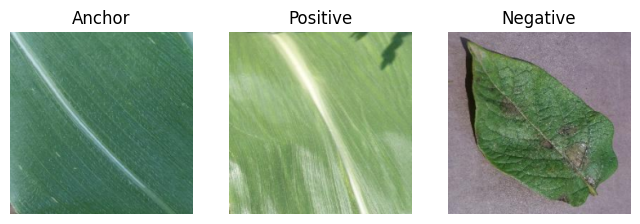

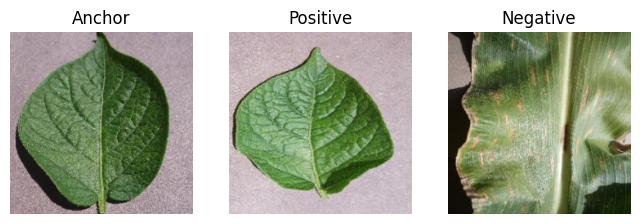

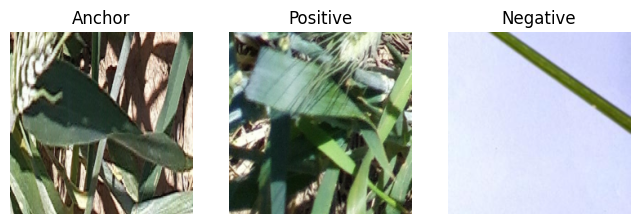

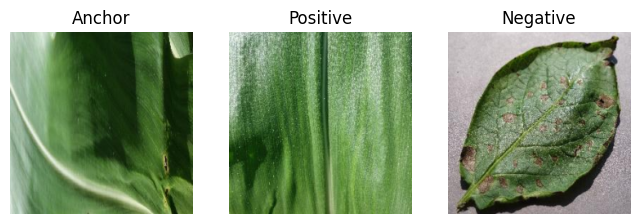

In [9]:
from torchvision import transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# Define transforms
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

# Initialize dataset
data_dir = "dataset/train"  # path to your dataset
triplet_ds = SiameseTripletDataset(root=data_dir, transform=transform)

# Wrap in DataLoader
loader = DataLoader(triplet_ds, batch_size=1, shuffle=True)

# Visualize a few triplets
for i, (a, p, n) in enumerate(loader):
    fig, axes = plt.subplots(1, 3, figsize=(8, 3))
    axes[0].imshow(a[0].permute(1,2,0))
    axes[0].set_title("Anchor")
    axes[1].imshow(p[0].permute(1,2,0))
    axes[1].set_title("Positive")
    axes[2].imshow(n[0].permute(1,2,0))
    axes[2].set_title("Negative")
    for ax in axes: ax.axis("off")
    plt.show()
    if i == 3: break  # show 3 triplets only


In [10]:
from torch import amp

In [11]:
class SiameseTrainer:
    def __init__(self, model, device, lr=1e-3, log_interval=20, use_amp=False, checkpoint_dir="siamese_crops_checkpoints"):
        model = model.to(device)
        if torch.cuda.device_count() > 1:
            print(f"Using {torch.cuda.device_count()} GPUs with DataParallel")
            model = nn.DataParallel(model)
        self.model = model # torch.compile(model)
        if isinstance(self.model, nn.DataParallel):
            self.model_to_save = self.model.module
        else:
            self.model_to_save = self.model

        self.device = device
        self.optimizer = torch.optim.Adam(filter(lambda p: p.requires_grad, self.model.parameters()), lr=lr)
        self.criterion = nn.TripletMarginLoss(margin=1.0, p=2)
        self.scaler = amp.GradScaler("cuda", enabled=use_amp)
        self.use_amp = use_amp
        self.log_interval = log_interval

        self.checkpoint_dir = checkpoint_dir
        os.makedirs(self.checkpoint_dir, exist_ok=True)
        self.best_loss = float('inf')
        self.count_trainable_parameters()

    def count_trainable_parameters(self):
        """Counts and prints the number of trainable parameters in the model."""
        num_params = sum(p.numel() for p in self.model.parameters() if p.requires_grad)
        print(f"Number of trainable parameters: {num_params:,}")
        return num_params

    def train(self, train_loader, epochs=5):
        self.model.train()

        epoch_bar = tqdm(range(epochs), desc="Epochs")
        for epoch in epoch_bar:
            total_loss = 0

            batch_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}", leave=False)
            for batch_idx, (a, p, n) in enumerate(batch_bar):
                a, p, n = a.to(self.device), p.to(self.device), n.to(self.device)

                with amp.autocast("cuda", enabled=self.use_amp):
                    emb_a = self.model(a)
                    emb_p = self.model(p)
                    emb_n = self.model(n)
                    loss = self.criterion(emb_a, emb_p, emb_n)

                self.optimizer.zero_grad(set_to_none=True)
                self.scaler.scale(loss).backward()
                self.scaler.step(self.optimizer)
                self.scaler.update()

                total_loss += loss.item()
                batch_bar.set_postfix(loss=f"{loss.item():.4f}")

            avg_loss = total_loss / len(train_loader)
            epoch_bar.set_postfix(avg_loss=f"{avg_loss:.4f}")

            last_checkpoint_path = os.path.join(self.checkpoint_dir, "siamese_crops_last_model.pth")
            self.save_checkpoint(last_checkpoint_path, epoch, avg_loss)

            if avg_loss < self.best_loss:
                self.best_loss = avg_loss
                best_checkpoint_path = os.path.join(self.checkpoint_dir, "siamese_crops_best_model.pth")
                self.save_checkpoint(best_checkpoint_path, epoch, self.best_loss)
                tqdm.write(f"best model updated: {self.best_loss:.4f} at epoch {epoch+1}")

    def save_checkpoint(self, file_path, epoch, loss):
        """Saves a checkpoint dictionary to a file (works for single & multi-GPU)."""
        # unwrap model if DataParallel was used
        model_to_save = self.model.module if isinstance(self.model, torch.nn.DataParallel) else self.model
        checkpoint = {
            'epoch': epoch + 1,
            'model_state_dict': model_to_save.state_dict(),
            'optimizer_state_dict': self.optimizer.state_dict(),
            'scaler_state_dict': self.scaler.state_dict() if hasattr(self, "scaler") else None,
            'loss': loss,
        }
        # save checkpoint (portable)
        torch.save(checkpoint, file_path)
    
        print(f"Checkpoint saved at {file_path}")

    def save_embeddings(self, dataloader, save_path="embeddings.pt"):
        """Extract embeddings for whole dataset"""
        self.model.eval()
        embeddings, labels = [], []
        with torch.no_grad():
            for imgs, lbls in dataloader:
                imgs = imgs.to(self.device)
                emb = self.model(imgs)
                embeddings.append(emb.cpu())
                labels.append(lbls)
        torch.save({"embeddings": torch.cat(embeddings), "labels": torch.cat(labels)}, save_path)
        print(f"Embeddings saved to {save_path}")

In [12]:
data_dir = "dataset/train" # @param {"type":"string","placeholder":"Dataset directory path"}
BATCH_SIZE = 512 # @param {"type":"integer","placeholder":"128"}
IMAGE_SIZE = 224 # @param {"type":"integer","placeholder":"224"}
NUM_WORKERS = os.cpu_count()
EPOCHS = 20 # @param {"type":"integer","placeholder":"10"}
LR = 1e-5 # @param {"type":"number","placeholder":"1e-3"}

transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE,IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])

triplet_dataset = SiameseTripletDataset(root=data_dir, transform=transform)
triplet_loader = DataLoader(
    triplet_dataset, batch_size=BATCH_SIZE,
    shuffle=True, num_workers=NUM_WORKERS,
    pin_memory=True
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [15]:
model = Siamese(backbone="resnet18", embedding_dim=128, freeze_backbone=True)
model.to(device)
trainer = SiameseTrainer(model, device, lr=1e-5, use_amp=True)

Using 2 GPUs with DataParallel
Number of trainable parameters: 65,664


In [16]:
# trainer.train(triplet_loader, epochs=10)

Epochs:  10%|█         | 1/10 [05:30<49:38, 331.00s/it, avg_loss=0.8326]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.8326 at epoch 1



Epochs:  20%|██        | 2/10 [10:35<42:05, 315.66s/it, avg_loss=0.8304]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.8304 at epoch 2



Epochs:  30%|███       | 3/10 [15:53<36:56, 316.59s/it, avg_loss=0.8254]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.8254 at epoch 3



Epochs:  40%|████      | 4/10 [21:23<32:11, 321.97s/it, avg_loss=0.8149]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.8149 at epoch 4



Epochs:  50%|█████     | 5/10 [26:37<26:34, 318.84s/it, avg_loss=0.8130]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.8130 at epoch 5



Epochs:  60%|██████    | 6/10 [31:52<21:10, 317.61s/it, avg_loss=0.7957]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.7957 at epoch 6



Epochs:  70%|███████   | 7/10 [37:07<15:50, 316.92s/it, avg_loss=0.7930]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.7930 at epoch 7



Epochs:  80%|████████  | 8/10 [42:15<10:27, 313.95s/it, avg_loss=0.7858]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.7858 at epoch 8



Epochs:  90%|█████████ | 9/10 [47:47<05:19, 319.61s/it, avg_loss=0.7771]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.7771 at epoch 9



Epochs: 100%|██████████| 10/10 [53:04<00:00, 318.40s/it, avg_loss=0.7695]

Checkpoint saved at siamese_crops_checkpoints/siamese_crops_last_model.pth
Checkpoint saved at siamese_crops_checkpoints/siamese_crops_best_model.pth
best model updated: 0.7695 at epoch 10


In [17]:
model_to_save = trainer.model.module if isinstance(trainer.model, torch.nn.DataParallel) else trainer.model
checkpoint = {
    'epoch': 1,
    'model_state_dict': model_to_save.state_dict(),
    'optimizer_state_dict': trainer.optimizer.state_dict(),
    'scaler_state_dict': trainer.scaler.state_dict() if hasattr(trainer, "scaler") else None,
}
# save checkpoint (portable)
torch.save(checkpoint, "siamese_crops_first_model.pth")

In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [13]:
class Siamese(nn.Module):
    def __init__(self, backbone="resnet18", pretrained=True, embedding_dim=128, freeze_backbone=True):
        super().__init__()
        if backbone == "resnet18":
            base = models.resnet18(pretrained=pretrained)
            in_features = base.fc.in_features
            base.fc = nn.Identity()  # remove final classifier
        elif backbone == "resnet50":
            base = models.resnet50(pretrained=pretrained)
            in_features = base.fc.in_features
            base.fc = nn.Identity()  # remove final classifier
        else:
            raise NotImplementedError("Only resnet18 implemented here")

        self.backbone = base
        self.embedding = nn.Linear(in_features, embedding_dim)

        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False

    def forward(self, x):
        x = self.backbone(x)        # features
        x = self.embedding(x)       # project to embedding_dim
        x = F.normalize(x, p=2, dim=1)  # L2 normalize
        return x

siamese_model = Siamese()

siamese_model.load_state_dict(
    torch.load("siamese_crops_first_model.pth", map_location='cpu').get("model_state_dict")
)


<All keys matched successfully>

In [23]:

# Define the new classifier
class Classifier(nn.Module):
    def __init__(self, siamese_model, num_classes):
        super().__init__()
        self.siamese_model = siamese_model
        # Freeze the siamese model
        for param in self.siamese_model.parameters():
            param.requires_grad = False
        
        # New classifier layer
        self.classifier = nn.Linear(128, num_classes)

    def forward(self, x):
        # Get the embeddings from the siamese model
        x = self.siamese_model(x)
        # Classify
        x = self.classifier(x)
        return x

In [19]:
train_dir = "dataset/train"
val_dir = "dataset/val"

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Create a dummy dataset with 10 classes
# Use ImageFolder to load your dataset
train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform)


# Get the number of classes from the dataset
num_classes = len(train_dataset.classes)
print(f"Found {len(train_dataset)} images belonging to {num_classes} classes.")

num_classes = len(val_dataset.classes)
print(f"Found {len(val_dataset)} images belonging to {num_classes} classes.")

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

Found 10654 images belonging to 17 classes.
Found 1328 images belonging to 17 classes.


In [25]:
import torch.optim as optim

classifier = Classifier(siamese_model, num_classes=num_classes)
classifier.to(device)
if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs for training.")
    classifier = nn.DataParallel(classifier)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(classifier.parameters(), lr=0.001)

Using 2 GPUs for training.


In [26]:
# Training loop
num_epochs = 5
best_accuracy = 0.0

for epoch in range(num_epochs):
    classifier.train()
    running_loss = 0.0
    
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]")
    for i, (images, labels) in enumerate(train_bar):
        images, labels = images.to(device), labels.to(device)        
        optimizer.zero_grad()
        outputs = classifier(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}")

    # Validation loop
    classifier.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            
            outputs = classifier(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Validation Accuracy after Epoch {epoch+1}: {accuracy:.2f} %')
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        model_to_save = classifier.module if isinstance(classifier, nn.DataParallel) else classifier
        checkpoint = {
            'epoch': epoch + 1,
            'model_state_dict': model_to_save.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': running_loss/len(train_loader),
            'accuracy': accuracy
        }
        torch.save(checkpoint, 'siamese_classifier_checkpoint_best.pth')
        print(f"Found new best model with accuracy {accuracy:.2f}%. Saved to best_checkpoint.pth")
        
    model_to_save = classifier.module if isinstance(classifier, nn.DataParallel) else classifier
    torch.save(model_to_save.state_dict(), 'siamese_classifier.pth')
    print("Saved trained classifier model to siamese_classifier.pth")

print("Finished Training")


Epoch 1/5, Loss: 2.6417565913427445
Validation Accuracy after Epoch 1: 60.39 %
Found new best model with accuracy 60.39%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth
Epoch 2/5, Loss: 2.3183637999352955
Validation Accuracy after Epoch 2: 68.45 %
Found new best model with accuracy 68.45%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth
Epoch 3/5, Loss: 2.061428813707261
Validation Accuracy after Epoch 3: 72.67 %
Found new best model with accuracy 72.67%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth
Epoch 4/5, Loss: 1.8480156929720015
Validation Accuracy after Epoch 4: 74.70 %
Found new best model with accuracy 74.70%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth
Epoch 5/5, Loss: 1.6710716713042486
Validation Accuracy after Epoch 5: 74.92 %
Found new best model with accuracy 74.92%. Saved to best_checkpoint.pth
Saved trained clas

In [27]:
torch.save(model_to_save, 'siamese_classifier_full.pth')

guess it will take few more epochs

In [28]:
# Training loop
num_epochs = 20
# best_accuracy = 0.0

for epoch in range(num_epochs):
    classifier.train()
    running_loss = 0.0
    
    train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]")
    for i, (images, labels) in enumerate(train_bar):
        images, labels = images.to(device), labels.to(device)        
        optimizer.zero_grad()
        outputs = classifier(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}")

    # Validation loop
    classifier.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            
            outputs = classifier(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Validation Accuracy after Epoch {epoch+1}: {accuracy:.2f} %')
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        model_to_save = classifier.module if isinstance(classifier, nn.DataParallel) else classifier
        checkpoint = {
            'epoch': epoch + 1,
            'model_state_dict': model_to_save.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': running_loss/len(train_loader),
            'accuracy': accuracy
        }
        torch.save(checkpoint, 'siamese_classifier_checkpoint_best.pth')
        print(f"Found new best model with accuracy {accuracy:.2f}%. Saved to best_checkpoint.pth")
        
    model_to_save = classifier.module if isinstance(classifier, nn.DataParallel) else classifier
    torch.save(model_to_save.state_dict(), 'siamese_classifier.pth')
    torch.save(model_to_save, 'siamese_classifier_full.pth')
    print("Saved trained classifier model to siamese_classifier.pth")

print("Finished Training")


Epoch 1/20 [Training]: 100%|██████████| 84/84 [02:08<00:00,  1.52s/it]

Epoch 1/20, Loss: 1.525490784928912


Validation Accuracy after Epoch 1: 75.75 %
Found new best model with accuracy 75.75%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 2/20 [Training]: 100%|██████████| 84/84 [02:12<00:00,  1.57s/it]

Epoch 2/20, Loss: 1.398280836286999


Validation Accuracy after Epoch 2: 76.73 %
Found new best model with accuracy 76.73%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 3/20 [Training]: 100%|██████████| 84/84 [02:11<00:00,  1.57s/it]

Epoch 3/20, Loss: 1.2921634586084456


Validation Accuracy after Epoch 3: 77.48 %
Found new best model with accuracy 77.48%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 4/20 [Training]: 100%|██████████| 84/84 [02:14<00:00,  1.60s/it]

Epoch 4/20, Loss: 1.1986667882828486


Validation Accuracy after Epoch 4: 78.39 %
Found new best model with accuracy 78.39%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 5/20 [Training]: 100%|██████████| 84/84 [02:13<00:00,  1.58s/it]

Epoch 5/20, Loss: 1.1214920367513384


Validation Accuracy after Epoch 5: 78.77 %
Found new best model with accuracy 78.77%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 6/20 [Training]: 100%|██████████| 84/84 [02:13<00:00,  1.59s/it]

Epoch 6/20, Loss: 1.0504006111905688


Validation Accuracy after Epoch 6: 78.99 %
Found new best model with accuracy 78.99%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 7/20 [Training]: 100%|██████████| 84/84 [02:10<00:00,  1.56s/it]

Epoch 7/20, Loss: 0.9889351377884547


Validation Accuracy after Epoch 7: 79.97 %
Found new best model with accuracy 79.97%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 8/20 [Training]: 100%|██████████| 84/84 [02:06<00:00,  1.50s/it]

Epoch 8/20, Loss: 0.9367181970959618


Validation Accuracy after Epoch 8: 81.02 %
Found new best model with accuracy 81.02%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 9/20 [Training]: 100%|██████████| 84/84 [02:06<00:00,  1.51s/it]

Epoch 9/20, Loss: 0.8920062865529742


Validation Accuracy after Epoch 9: 80.72 %
Saved trained classifier model to siamese_classifier.pth


Epoch 10/20 [Training]: 100%|██████████| 84/84 [02:10<00:00,  1.56s/it]

Epoch 10/20, Loss: 0.8506365524871009


Validation Accuracy after Epoch 10: 81.33 %
Found new best model with accuracy 81.33%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 11/20 [Training]: 100%|██████████| 84/84 [02:09<00:00,  1.54s/it]

Epoch 11/20, Loss: 0.8088225615876061


Validation Accuracy after Epoch 11: 82.15 %
Found new best model with accuracy 82.15%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 12/20 [Training]: 100%|██████████| 84/84 [02:12<00:00,  1.58s/it]

Epoch 12/20, Loss: 0.7756642968881697


Validation Accuracy after Epoch 12: 82.76 %
Found new best model with accuracy 82.76%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 13/20 [Training]: 100%|██████████| 84/84 [02:08<00:00,  1.53s/it]

Epoch 13/20, Loss: 0.7451100193318867


Validation Accuracy after Epoch 13: 83.81 %
Found new best model with accuracy 83.81%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 14/20 [Training]: 100%|██████████| 84/84 [02:14<00:00,  1.60s/it]

Epoch 14/20, Loss: 0.7217898773295539


Validation Accuracy after Epoch 14: 83.21 %
Saved trained classifier model to siamese_classifier.pth


Epoch 15/20 [Training]: 100%|██████████| 84/84 [02:16<00:00,  1.63s/it]

Epoch 15/20, Loss: 0.691668879418146


Validation Accuracy after Epoch 15: 83.89 %
Found new best model with accuracy 83.89%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 16/20 [Training]: 100%|██████████| 84/84 [02:12<00:00,  1.58s/it]

Epoch 16/20, Loss: 0.6700127266702198


Validation Accuracy after Epoch 16: 84.04 %
Found new best model with accuracy 84.04%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 17/20 [Training]: 100%|██████████| 84/84 [02:06<00:00,  1.50s/it]

Epoch 17/20, Loss: 0.6498931298653284


Validation Accuracy after Epoch 17: 84.19 %
Found new best model with accuracy 84.19%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 18/20 [Training]: 100%|██████████| 84/84 [02:10<00:00,  1.56s/it]

Epoch 18/20, Loss: 0.6252914745183218


Validation Accuracy after Epoch 18: 84.49 %
Found new best model with accuracy 84.49%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 19/20 [Training]: 100%|██████████| 84/84 [02:12<00:00,  1.58s/it]

Epoch 19/20, Loss: 0.613031268119812


Validation Accuracy after Epoch 19: 85.24 %
Found new best model with accuracy 85.24%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth


Epoch 20/20 [Training]: 100%|██████████| 84/84 [02:12<00:00,  1.58s/it]

Epoch 20/20, Loss: 0.59078822213979


Validation Accuracy after Epoch 20: 85.32 %
Found new best model with accuracy 85.32%. Saved to best_checkpoint.pth
Saved trained classifier model to siamese_classifier.pth
Finished Training


# Visualize

Searching for experiment logs...
  - Found experiment 'resnet18_finetune', parsing logs...
  - Found experiment 'test_mobilenet_v2', parsing logs...
  - Found experiment 'resnet18_transfer', parsing logs...
  - Found experiment 'resnet18_transfer_pretrained', parsing logs...
  - Found experiment 'efficientnet_b2', parsing logs...
  - Found experiment 'mobilenet_v2_finetuned', parsing logs...
  - Found experiment 'mobilenet_v2', parsing logs...

Plotting results...
Plot saved to experiment_comparison_plot.png


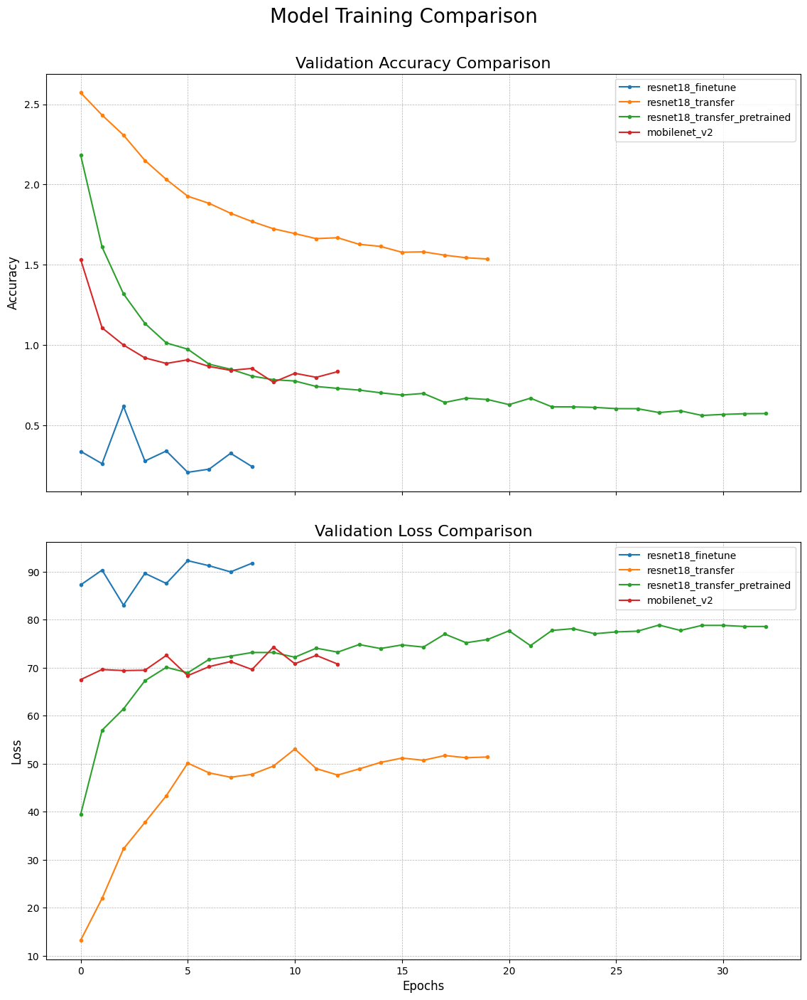

In [33]:
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from collections import defaultdict
from pathlib import Path

# --- Configuration ---
# Directory containing all your experiment runs.
RUNS_DIR = "runs"

# The specific tags you want to extract from the event files.
# IMPORTANT: These must match the names you used in TensorBoard/Keras callbacks.
# Common names include 'val_accuracy', 'val_loss', 'epoch_val_accuracy', etc.
# Check your TensorBoard to find the exact names if these don't work.
  # - 'Accuracy/train'
  # - 'Accuracy/val'
  # - 'Loss/train'
  # - 'Loss/val'

VAL_ACCURACY_TAG = 'Loss/val'
VAL_LOSS_TAG = 'Accuracy/val'


def parse_tfevents_file(filepath):
    """
    Parses a single tfevents file to extract scalar data for specified tags.
    """
    data = defaultdict(list)
    try:
        # Use summary_iterator to read the event file
        for event in tf.compat.v1.train.summary_iterator(str(filepath)):
            for value in event.summary.value:
                if value.tag in [VAL_ACCURACY_TAG, VAL_LOSS_TAG]:
                    # Store the step (epoch) and the scalar value
                    data[value.tag].append((event.step, value.simple_value))
    except Exception as e:
        print(f"Error parsing file {filepath}: {e}")
    return data

def main():
    """
    Main function to find all event files, parse them, and plot the results.
    """
    root_dir = Path(RUNS_DIR)
    if not root_dir.is_dir():
        print(f"Error: Directory '{RUNS_DIR}' not found.")
        return

    all_experiments_data = {}
    
    print("Searching for experiment logs...")
    # Walk through the runs directory to find experiment folders
    for experiment_dir in root_dir.iterdir():
        if experiment_dir.is_dir():
            event_files = list(experiment_dir.glob("events.out.tfevents.*"))
            if not event_files:
                continue # Skip directories without event files

            # For simplicity, we parse the first event file found.
            # If you have multiple, you might want to parse the latest one.
            latest_event_file = event_files[0]
            experiment_name = experiment_dir.name
            
            print(f"  - Found experiment '{experiment_name}', parsing logs...")
            
            # Parse the data and store it
            parsed_data = parse_tfevents_file(latest_event_file)
            if parsed_data:
                all_experiments_data[experiment_name] = parsed_data

    if not all_experiments_data:
        print("\nNo valid experiment data found. Exiting.")
        return

    # --- Plotting the Results ---
    print("\nPlotting results...")
    
    # Create a figure with two subplots (one for accuracy, one for loss)
    fig, axes = plt.subplots(2, 1, figsize=(12, 14), sharex=True)
    
    # Plot Validation Accuracy
    ax1 = axes[0]
    for name, data in all_experiments_data.items():
        if VAL_ACCURACY_TAG in data and data[VAL_ACCURACY_TAG]:
            steps, values = zip(*sorted(data[VAL_ACCURACY_TAG]))
            ax1.plot(steps, values, label=name, marker='.', linestyle='-')
    
    ax1.set_title("Validation Accuracy Comparison", fontsize=16)
    ax1.set_ylabel("Accuracy", fontsize=12)
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax1.legend()

    # Plot Validation Loss
    ax2 = axes[1]
    for name, data in all_experiments_data.items():
        if VAL_LOSS_TAG in data and data[VAL_LOSS_TAG]:
            steps, values = zip(*sorted(data[VAL_LOSS_TAG]))
            ax2.plot(steps, values, label=name, marker='.', linestyle='-')
            
    ax2.set_title("Validation Loss Comparison", fontsize=16)
    ax2.set_xlabel("Epochs", fontsize=12)
    ax2.set_ylabel("Loss", fontsize=12)
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax2.legend()
    
    plt.tight_layout(pad=3.0)
    plt.suptitle("Model Training Comparison", fontsize=20, y=1.02)
    
    # Save the figure
    output_path = "experiment_comparison_plot.png"
    plt.savefig(output_path)
    print(f"Plot saved to {output_path}")
    
    plt.show()


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
main()

In [34]:
import tensorflow as tf
from pathlib import Path
import sys

EXPERIMENT_DIR = "runs"

def find_scalar_tags(experiment_dir):
    """Scans the event file in a directory and prints all scalar tags."""
    event_dir = Path(experiment_dir)
    if not event_dir.is_dir():
        print(f"Error: Directory not found at '{event_dir}'")
        return

    event_files = list(event_dir.glob("events.out.tfevents.*"))
    if not event_files:
        print(f"No event files found in '{event_dir}'")
        return

    # Use the first event file found
    filepath = event_files[0]
    tags = set()
    
    print(f"\nScanning tags in: {filepath.name}...")
    try:
        for event in tf.compat.v1.train.summary_iterator(str(filepath)):
            for value in event.summary.value:
                if value.HasField('simple_value'): # This identifies it as a scalar
                    tags.add(value.tag)
    except Exception as e:
        print(f"An error occurred while reading the file: {e}")
        return
        
    if tags:
        print("\nFound the following scalar tags:")
        for tag in sorted(list(tags)):
            print(f"  - '{tag}'")
        print("\nLook for the tags related to validation accuracy and loss in the list above.")
    else:
        print("No scalar tags were found in this event file.")


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
exps = [os.path.join(EXPERIMENT_DIR, d) for d in os.listdir(EXPERIMENT_DIR)]

for exp in exps:
    find_scalar_tags(exp)


Scanning tags in: events.out.tfevents.1759256224.5b1083b4e39a.36.0...

Found the following scalar tags:
  - 'Accuracy/train'
  - 'Accuracy/val'
  - 'Loss/train'
  - 'Loss/val'

Look for the tags related to validation accuracy and loss in the list above.

Scanning tags in: events.out.tfevents.1759235683.61afd74eb675.36.3...

Found the following scalar tags:
  - 'Test/Accuracy'
  - 'Test/Loss'
  - 'Test/MacroF1'
  - 'Test/MacroPrecision'
  - 'Test/MacroRecall'

Look for the tags related to validation accuracy and loss in the list above.

Scanning tags in: events.out.tfevents.1759190506.58edd1177da6.134.0...

Found the following scalar tags:
  - 'Accuracy/train'
  - 'Accuracy/val'
  - 'Loss/train'
  - 'Loss/val'

Look for the tags related to validation accuracy and loss in the list above.

Scanning tags in: events.out.tfevents.1759227553.61afd74eb675.36.0...

Found the following scalar tags:
  - 'Accuracy/train'
  - 'Accuracy/val'
  - 'Loss/train'
  - 'Loss/val'

Look for the tags relate

In [37]:
# !zip -r runs.zip /kaggle/working/runs
# !rm -rf runs.zip

In [38]:
class Siamese(nn.Module):
    def __init__(self, backbone="resnet18", pretrained=False, embedding_dim=128):
        # `pretrained` should be False as we are loading our own checkpoint
        super().__init__()
        if backbone == "resnet18":
            base = models.resnet18(weights=None) # Load architecture only
            in_features = base.fc.in_features
            base.fc = nn.Identity()
        elif backbone == "resnet50":
            base = models.resnet50(weights=None) # Load architecture only
            in_features = base.fc.in_features
            base.fc = nn.Identity()
        else:
            raise NotImplementedError("Only resnet18 and resnet50 implemented here")

        self.backbone = base
        self.embedding = nn.Linear(in_features, embedding_dim)
        # We don't need to freeze here, as the whole model state is loaded
        # and TestRunner runs in eval mode with no_grad().

    def forward(self, x):
        x = self.backbone(x)
        x = self.embedding(x)
        x = F.normalize(x, p=2, dim=1)
        return x

class Classifier(nn.Module):
    def __init__(self, siamese_model, num_classes):
        super().__init__()
        self.siamese_model = siamese_model
        self.classifier = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.siamese_model(x)
        x = self.classifier(x)
        return x


In [39]:

import time

class TestRunner:
    """
    TestRunner evaluates a classification model on a test set (folder or DataLoader),
    plots confusion matrix, sample predictions, most-confident incorrect predictions,
    logs everything to TensorBoard and saves per-experiment CSV/JSON results for later comparison.
    """

    def __init__(
        self,
        model: torch.nn.Module,
        test_dir: Optional[str] = None,
        test_loader: Optional[DataLoader] = None,
        device: Optional[torch.device] = None,
        batch_size: int = 64,
        num_workers: int = 4,
        transform: Optional[transforms.Compose] = None,
        log_dir: str = "runs/test",
        results_dir: str = "results/test",
        criterion: Optional[nn.Module] = None,
    ):
        assert (test_dir is not None) or (test_loader is not None), "Pass either test_dir or test_loader"
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.model = model.to(self.device)
        self.test_dir = test_dir
        self.test_loader = test_loader
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.log_dir = log_dir
        self.results_dir = results_dir
        self.criterion = criterion or nn.CrossEntropyLoss()
        self.num_params = sum(p.numel() for p in self.model.parameters() if p.requires_grad)
        self.writer = SummaryWriter(log_dir=log_dir)

        # default transforms if not provided
        if transform is None:
            self.transform = transforms.Compose([
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
            ])
        else:
            self.transform = transform

        os.makedirs(self.results_dir, exist_ok=True)

        # if test_dir given, build DataLoader
        if self.test_loader is None and self.test_dir is not None:
            dataset = datasets.ImageFolder(root=self.test_dir, transform=self.transform)
            self.class_names = dataset.classes
            self.test_loader = DataLoader(dataset, batch_size=self.batch_size,
                                          shuffle=False, num_workers=self.num_workers)
        elif self.test_loader is not None:
            # try to read class names from the dataset if possible
            try:
                self.class_names = self.test_loader.dataset.classes
            except Exception:
                self.class_names = None

        if self.class_names is None:
            # fallback
            self.class_names = [str(i) for i in range(1000)]
            
    def inference_time(self, input_size=(1, 3, 224, 224), warmup=10, runs=100):
        """
        Measure average inference time per image (in milliseconds).
        input_size: tuple, e.g. (1, 3, 224, 224) for batch of 1 RGB image 224x224
        warmup: number of warmup runs before timing
        runs: number of timed runs
        """
        self.model.eval()
        dummy_input = torch.randn(input_size).to(self.device)

        # Warmup
        with torch.no_grad():
            for _ in range(warmup):
                _ = self.model(dummy_input)

        # Timed runs
        times = []
        with torch.no_grad():
            for _ in range(runs):
                start = time.time()
                _ = self.model(dummy_input)
                end = time.time()
                times.append((end - start) * 1000)  # convert to ms

        avg_time = np.mean(times)
        print(f"Average inference time per batch of {input_size[0]}: {avg_time:.2f} ms")
        print(f"Average inference time per image: {avg_time / input_size[0]:.2f} ms")
        return avg_time / input_size[0]
    
    
    def run(self, num_images_grid: int = 8, topk_incorrect: int = 20, save_csv: bool = True):
        """
        Evaluate the model on the test_loader and produce:
          - overall loss & accuracy
          - per-class precision/recall/f1
          - confusion matrix
          - plot sample correct & incorrect predictions (grid)
          - find most-confident incorrect predictions (high predicted probability but wrong)
          - save results as CSV/JSON
          - log figures to TensorBoard
        """
        self.model.eval()
        total_loss = 0.0
        total_correct = 0
        total_correct_top5 = 0
        total_samples = 0

        all_preds = []
        all_labels = []
        all_probs = []  # probability of the predicted class
        all_images = []  # store small subset of images for plotting

        with torch.no_grad():
            loop = tqdm(self.test_loader, desc="Testing")
            for images, labels in loop:
                images = images.to(self.device)
                labels = labels.to(self.device)
                outputs = self.model(images)  # shape (B, C)

                loss = self.criterion(outputs, labels)
                total_loss += loss.item() * images.size(0)

                # Predictions
                probs = F.softmax(outputs, dim=1)
                confs, preds = torch.max(probs, dim=1)

                # Top 1% accuracy
                total_correct += preds.eq(labels).sum().item()
                total_samples += labels.size(0)
                
                # Top 5% Accuracy
                _, top5_preds = torch.topk(probs, 5, dim=1)
                labels_reshaped = labels.view(-1, 1)
                # Check if the true label is in the top 5 predictions
                total_correct_top5 += torch.sum(top5_preds == labels_reshaped).item()

                all_preds.extend(preds.cpu().numpy().tolist())
                all_labels.extend(labels.cpu().numpy().tolist())
                all_probs.extend(confs.cpu().numpy().tolist())

                # store a few images for visual grid (as CPU tensors, de-normalized later)
                # store up to num_images_grid*2 images
                # if len(all_images) < num_images_grid * 2: # Remove this condition
                all_images.extend(images.cpu())

        avg_loss = total_loss / total_samples
        accuracy = 100.0 * total_correct / total_samples
        accuracy_top5 = 100.0 * total_correct_top5 / total_samples

        # Classification metrics
        precision, recall, f1, support = precision_recall_fscore_support(all_labels, all_preds, zero_division=0)
        class_report = classification_report(all_labels, all_preds, target_names=self.class_names, zero_division=0, output_dict=True)
        print("\nClassification Report:\n", class_report)

        # Confusion matrix
        cm = confusion_matrix(all_labels, all_preds)

        # Save base results
        results = {
            "num_samples": int(total_samples),
            "loss": float(avg_loss),
            "accuracy": float(accuracy),
            "accuracy_top5": float(accuracy_top5),
            "num_parameters": int(self.num_params),
            "inference_time_ms": self.inference_time(input_size=(1, 3, 224, 224)),
            "per_class": {self.class_names[i]: {
                "precision": float(precision[i]),
                "recall": float(recall[i]),
                "f1": float(f1[i]),
                "support": int(support[i])
            } for i in range(len(self.class_names))}
        }

        # Save json & csv summary
        if save_csv:
            # per-class csv
            perclass_rows = []
            for i, cname in enumerate(self.class_names):
                perclass_rows.append({
                    "class_idx": i,
                    "class_name": cname,
                    "precision": float(precision[i]),
                    "recall": float(recall[i]),
                    "f1": float(f1[i]),
                    "support": int(support[i])
                })
            df_perclass = pd.DataFrame(perclass_rows)
            perclass_csv = os.path.join(self.results_dir, "per_class_metrics.csv")
            df_perclass.to_csv(perclass_csv, index=False)

            # summary csv
            summary_df = pd.DataFrame([{
                "loss": avg_loss,
                "accuracy": accuracy,
                "num_samples": int(total_samples),
            }])
            summary_csv = os.path.join(self.results_dir, "summary.csv")
            summary_df.to_csv(summary_csv, index=False)

            # json
            json_path = os.path.join(self.results_dir, "results.json")
            with open(json_path, "w") as f:
                json.dump(results, f, indent=2)

        # Log scalars to TensorBoard
        self.writer.add_scalar("Test/Loss", avg_loss, 0)
        self.writer.add_scalar("Test/Accuracy", accuracy, 0)

        # Log per-class metrics as text and scalars (macro)
        macro_precision = float(np.nanmean(precision))
        macro_recall = float(np.nanmean(recall))
        macro_f1 = float(np.nanmean(f1))
        self.writer.add_scalar("Test/MacroPrecision", macro_precision, 0)
        self.writer.add_scalar("Test/MacroRecall", macro_recall, 0)
        self.writer.add_scalar("Test/MacroF1", macro_f1, 0)

        # Plot & save confusion matrix figure
        cm_fig = self._plot_confusion_matrix(cm, self.class_names, normalize=False)
        cm_path = os.path.join(self.results_dir, "confusion_matrix.png")
        cm_fig.savefig(cm_path, bbox_inches="tight")
        self.writer.add_figure("ConfusionMatrix", cm_fig)
        plt.close(cm_fig)

        # Plot normalized confusion matrix
        cm_norm_fig = self._plot_confusion_matrix(cm, self.class_names, normalize=True)
        cm_norm_path = os.path.join(self.results_dir, "confusion_matrix_norm.png")
        cm_norm_fig.savefig(cm_norm_path, bbox_inches="tight")
        self.writer.add_figure("ConfusionMatrix_Normalized", cm_norm_fig)
        plt.close(cm_norm_fig)

        # Save a couple of image grids (correct vs incorrect)
        grid_fig = self._plot_prediction_grid(all_images[:num_images_grid], all_labels[:num_images_grid], all_preds[:num_images_grid], self.class_names, num_images=num_images_grid)
        grid_path = os.path.join(self.results_dir, "prediction_grid.png")
        grid_fig.savefig(grid_path, bbox_inches="tight")
        self.writer.add_figure("SamplePredictions", grid_fig)
        plt.close(grid_fig)

        # Find most confident incorrect predictions
        top_incorrect_fig = self._plot_most_confident_incorrects(
            probs=np.array(all_probs),
            preds=np.array(all_preds),
            labels=np.array(all_labels),
            images=all_images,
            class_names=self.class_names,
            topk=topk_incorrect
        )
        if top_incorrect_fig is not None:
            top_incorrect_path = os.path.join(self.results_dir, "most_confident_incorrects.png")
            top_incorrect_fig.savefig(top_incorrect_path, bbox_inches="tight")
            self.writer.add_figure("MostConfidentIncorrects", top_incorrect_fig)
            plt.close(top_incorrect_fig)

        # Save a CSV with overall and per-class metrics for easy aggregation across experiments
        if save_csv:
            out_csv = os.path.join(self.results_dir, "metrics_for_aggregation.csv")
            rows = []
            for i, cname in enumerate(self.class_names):
                rows.append({
                    "experiment": os.path.basename(self.results_dir.rstrip('/')),
                    "class_idx": i,
                    "class_name": cname,
                    "precision": float(precision[i]),
                    "recall": float(recall[i]),
                    "f1": float(f1[i]),
                    "support": int(support[i]),
                    "overall_accuracy": accuracy,
                    "overall_accuracy_top5": accuracy_top5,
                    "overall_loss": avg_loss
                })
            pd.DataFrame(rows).to_csv(out_csv, index=False)

        np.save(os.path.join(self.results_dir, "predictions.npy"), np.array(all_preds))
        np.save(os.path.join(self.results_dir, "labels.npy"), np.array(all_labels))
        print(f"\nTest results saved to {self.results_dir}")
        print(f"Accuracy: {accuracy:.2f}%, Loss: {avg_loss:.4f}")
        return results

    def _plot_confusion_matrix(self, cm: np.ndarray, class_names: List[str], normalize: bool = False):
        """
        Return a matplotlib figure for the confusion matrix.
        """
        fig, ax = plt.subplots(figsize=(8, 6))
        if normalize:
            cm_sum = cm.sum(axis=1)[:, np.newaxis]
            cm_plot = np.divide(cm, cm_sum, where=cm_sum != 0)
            sns.heatmap(cm_plot, annot=True, fmt=".2f", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
            ax.set_title("Normalized Confusion Matrix")
        else:
            sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names, ax=ax)
            ax.set_title("Confusion Matrix (Counts)")
        ax.set_xlabel("Predicted")
        ax.set_ylabel("True")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        return fig

    def _denormalize(self, tensor_img: torch.Tensor):
        """Convert a normalized image tensor back to [0,1] numpy image for plotting."""
        img = tensor_img.clone()
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        img = img * std + mean
        img = img.clamp(0, 1)
        return img.permute(1, 2, 0).numpy()

    def _plot_prediction_grid(self, all_images: List[torch.Tensor], all_labels: List[int], all_preds: List[int],
                              class_names: List[str], num_images: int = 8):
        """
        Plot a grid of images showing predicted vs true label (a mix of correct + incorrect).
        """
        # Prepare a small selection
        n = min(len(all_images), num_images)
        fig, axes = plt.subplots(1, n, figsize=(n * 3, 3))
        for i in range(n):
            ax = axes[i] if n > 1 else axes
            img = self._denormalize(all_images[i])
            true = class_names[all_labels[i]]
            pred = class_names[all_preds[i]]
            ax.imshow(img)
            ax.set_title(f"T:{true}\nP:{pred}")
            ax.axis("off")
        plt.tight_layout()
        return fig

    def _plot_most_confident_incorrects(self, probs: np.ndarray, preds: np.ndarray, labels: np.ndarray,
                                        images: List[torch.Tensor], class_names: List[str], topk: int = 20):
        """
        Identify incorrect predictions where model was most confident, and plot topk of them.
        probs: predicted class probability for each item (same length as preds)
        """
        incorrect_mask = preds != labels
        if incorrect_mask.sum() == 0:
            print("No incorrect predictions to show.")
            return None

        incorrect_probs = probs[incorrect_mask]
        incorrect_indices = np.where(incorrect_mask)[0]
        # sort by descending predicted probability
        order = np.argsort(-incorrect_probs)
        topk_idx = incorrect_indices[order][:topk]

        n = len(topk_idx)
        cols = 5
        rows = max(1, int(np.ceil(n / cols)))
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
        axes = axes.flatten()
        for i, idx in enumerate(topk_idx):
            ax = axes[i]
            img = self._denormalize(images[idx])
            true = class_names[labels[idx]]
            pred = class_names[preds[idx]]
            conf = probs[idx]
            ax.imshow(img)
            ax.set_title(f"P:{pred} ({conf:.2f})\nT:{true}")
            ax.axis("off")
        # hide extra axes
        for j in range(n, len(axes)):
            axes[j].axis("off")
        plt.tight_layout()
        return fig

  
def compare_runs(results_root: str, out_fig: Optional[str] = None):
    """
    Aggregate all 'metrics_for_aggregation.csv' under results_root
    and create a comparison table/plot for overall accuracy & per-class f1 across experiments.

    results_root: folder containing subfolders for each experiment (each should have metrics_for_aggregation.csv)
    """
    csv_paths = list(Path(results_root).rglob("metrics_for_aggregation.csv"))
    if len(csv_paths) == 0:
        raise FileNotFoundError("No metrics_for_aggregation.csv files found under " + str(results_root))

    dfs = []
    for p in csv_paths:
        df = pd.read_csv(p)
        # add experiment name if missing
        if 'experiment' not in df.columns:
            df['experiment'] = p.parent.name
        dfs.append(df)

    all_df = pd.concat(dfs, ignore_index=True)
    # overall accuracy per experiment: take first row's overall_accuracy (they're same per file)
    overall = all_df.groupby('experiment')[['overall_accuracy', 'overall_loss']].mean().reset_index()

    # Quick barplot: overall_accuracy
    
    fig, ax = plt.subplots(figsize=(10, 8))  # taller instead of wider
    sns.barplot(
        data=overall.sort_values('overall_accuracy', ascending=True),  # sort ascending for horizontal bars
        y='experiment', x='overall_accuracy', ax=ax
    )
    ax.set_xlabel("Accuracy (%)")
    ax.set_ylabel("Experiment")
    plt.tight_layout()
    plt.title("Overall Test Accuracy by Experiment")
    if out_fig:
        fig.savefig(out_fig, bbox_inches="tight")
    return all_df, fig

In [40]:
from torchvision import datasets

test_data = datasets.ImageFolder("dataset/test")
print("Found classes:", test_data.classes)
print("Total images:", len(test_data))

Found classes: ['Corn___Common_Rust', 'Corn___Gray_Leaf_Spot', 'Corn___Healthy', 'Corn___Northern_Leaf_Blight', 'Potato___Early_Blight', 'Potato___Healthy', 'Potato___Late_Blight', 'Rice___Brown_Spot', 'Rice___Healthy', 'Rice___Leaf_Blast', 'Rice___Neck_Blast', 'Sugarcane__Bacterial Blight', 'Sugarcane__Healthy', 'Sugarcane__Red Rot', 'Wheat___Brown_Rust', 'Wheat___Healthy', 'Wheat___Yellow_Rust']
Total images: 1342


In [41]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [48]:
from tqdm import tqdm
all_models = [os.path.join(".", m) for m in os.listdir(".") if m.endswith(".pth")]
for path in all_models:
    if "siamese" in path:
        continue
    print(f"\nEvaluating model: {os.path.basename(path)}")
    model_name = os.path.splitext(os.path.basename(path))[0]
    model = torch.load(path, map_location=device, weights_only=False)
    tester = TestRunner(
        model,
        test_dir="dataset/test",
        device=device,
        log_dir=f"runs/{model_name}_test",
        results_dir=f"results/{model_name}_results",
        batch_size=64,
        num_workers=os.cpu_count() // 2
    )
    tester.run(num_images_grid=8, topk_incorrect=5)
        


Evaluating model: Kaggle_MobileNetV2_Agri_best.pth


Testing: 100%|██████████| 21/21 [00:21<00:00,  1.02s/it]



Classification Report:
 {'Corn___Common_Rust': {'precision': 0.7100591715976331, 'recall': 1.0, 'f1-score': 0.8304498269896193, 'support': 120}, 'Corn___Gray_Leaf_Spot': {'precision': 0.8, 'recall': 0.7692307692307693, 'f1-score': 0.7843137254901961, 'support': 52}, 'Corn___Healthy': {'precision': 0.9866666666666667, 'recall': 0.6324786324786325, 'f1-score': 0.7708333333333334, 'support': 117}, 'Corn___Northern_Leaf_Blight': {'precision': 0.8421052631578947, 'recall': 0.6464646464646465, 'f1-score': 0.7314285714285714, 'support': 99}, 'Potato___Early_Blight': {'precision': 1.0, 'recall': 0.94, 'f1-score': 0.9690721649484536, 'support': 100}, 'Potato___Healthy': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16}, 'Potato___Late_Blight': {'precision': 0.8114754098360656, 'recall': 0.99, 'f1-score': 0.8918918918918919, 'support': 100}, 'Rice___Brown_Spot': {'precision': 0.5121951219512195, 'recall': 0.3387096774193548, 'f1-score': 0.4077669902912621, 'support': 62}, 'Rice_

Testing: 100%|██████████| 21/21 [00:21<00:00,  1.01s/it]



Classification Report:
 {'Corn___Common_Rust': {'precision': 0.8939393939393939, 'recall': 0.49166666666666664, 'f1-score': 0.6344086021505376, 'support': 120}, 'Corn___Gray_Leaf_Spot': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 52}, 'Corn___Healthy': {'precision': 0.42916666666666664, 'recall': 0.8803418803418803, 'f1-score': 0.5770308123249299, 'support': 117}, 'Corn___Northern_Leaf_Blight': {'precision': 0.27627627627627627, 'recall': 0.9292929292929293, 'f1-score': 0.42592592592592593, 'support': 99}, 'Potato___Early_Blight': {'precision': 0.9655172413793104, 'recall': 0.28, 'f1-score': 0.434108527131783, 'support': 100}, 'Potato___Healthy': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16}, 'Potato___Late_Blight': {'precision': 0.2692307692307692, 'recall': 0.07, 'f1-score': 0.1111111111111111, 'support': 100}, 'Rice___Brown_Spot': {'precision': 0.5, 'recall': 0.3225806451612903, 'f1-score': 0.39215686274509803, 'support': 62}, 'Rice___Healthy':

Testing: 100%|██████████| 21/21 [00:20<00:00,  1.02it/s]



Classification Report:
 {'Corn___Common_Rust': {'precision': 0.8814814814814815, 'recall': 0.9916666666666667, 'f1-score': 0.9333333333333335, 'support': 120}, 'Corn___Gray_Leaf_Spot': {'precision': 0.8666666666666667, 'recall': 0.5, 'f1-score': 0.6341463414634146, 'support': 52}, 'Corn___Healthy': {'precision': 1.0, 'recall': 0.7948717948717948, 'f1-score': 0.8857142857142858, 'support': 117}, 'Corn___Northern_Leaf_Blight': {'precision': 0.7563025210084033, 'recall': 0.9090909090909091, 'f1-score': 0.8256880733944952, 'support': 99}, 'Potato___Early_Blight': {'precision': 0.9333333333333333, 'recall': 0.98, 'f1-score': 0.9560975609756097, 'support': 100}, 'Potato___Healthy': {'precision': 1.0, 'recall': 0.875, 'f1-score': 0.9333333333333333, 'support': 16}, 'Potato___Late_Blight': {'precision': 0.978494623655914, 'recall': 0.91, 'f1-score': 0.9430051813471503, 'support': 100}, 'Rice___Brown_Spot': {'precision': 0.4857142857142857, 'recall': 0.5483870967741935, 'f1-score': 0.515151515

Testing: 100%|██████████| 21/21 [00:20<00:00,  1.00it/s]



Classification Report:
 {'Corn___Common_Rust': {'precision': 0.9915966386554622, 'recall': 0.9833333333333333, 'f1-score': 0.9874476987447698, 'support': 120}, 'Corn___Gray_Leaf_Spot': {'precision': 0.94, 'recall': 0.9038461538461539, 'f1-score': 0.9215686274509804, 'support': 52}, 'Corn___Healthy': {'precision': 0.9831932773109243, 'recall': 1.0, 'f1-score': 0.9915254237288135, 'support': 117}, 'Corn___Northern_Leaf_Blight': {'precision': 0.9583333333333334, 'recall': 0.9292929292929293, 'f1-score': 0.9435897435897437, 'support': 99}, 'Potato___Early_Blight': {'precision': 1.0, 'recall': 0.99, 'f1-score': 0.9949748743718593, 'support': 100}, 'Potato___Healthy': {'precision': 0.8421052631578947, 'recall': 1.0, 'f1-score': 0.9142857142857143, 'support': 16}, 'Potato___Late_Blight': {'precision': 0.9896907216494846, 'recall': 0.96, 'f1-score': 0.9746192893401014, 'support': 100}, 'Rice___Brown_Spot': {'precision': 0.6923076923076923, 'recall': 0.2903225806451613, 'f1-score': 0.409090909

Testing: 100%|██████████| 21/21 [00:20<00:00,  1.01it/s]



Classification Report:
 {'Corn___Common_Rust': {'precision': 0.1235480464625132, 'recall': 0.975, 'f1-score': 0.21930646672914714, 'support': 120}, 'Corn___Gray_Leaf_Spot': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 52}, 'Corn___Healthy': {'precision': 0.125, 'recall': 0.13675213675213677, 'f1-score': 0.1306122448979592, 'support': 117}, 'Corn___Northern_Leaf_Blight': {'precision': 0.1368421052631579, 'recall': 0.13131313131313133, 'f1-score': 0.13402061855670103, 'support': 99}, 'Potato___Early_Blight': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 100}, 'Potato___Healthy': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 16}, 'Potato___Late_Blight': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 100}, 'Rice___Brown_Spot': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 62}, 'Rice___Healthy': {'precision': 0.6106870229007634, 'recall': 0.5333333333333333, 'f1-score': 0.5693950177935944, 'support': 150}, 'Ric

(                           experiment  class_idx                   class_name  \
 0   Kaggle_ResNet18_Agri_best_results          0           Corn___Common_Rust   
 1   Kaggle_ResNet18_Agri_best_results          1        Corn___Gray_Leaf_Spot   
 2   Kaggle_ResNet18_Agri_best_results          2               Corn___Healthy   
 3   Kaggle_ResNet18_Agri_best_results          3  Corn___Northern_Leaf_Blight   
 4   Kaggle_ResNet18_Agri_best_results          4        Potato___Early_Blight   
 ..                                ...        ...                          ...   
 80   Kaggle_ResNet18_Finetune_results         12           Sugarcane__Healthy   
 81   Kaggle_ResNet18_Finetune_results         13           Sugarcane__Red Rot   
 82   Kaggle_ResNet18_Finetune_results         14           Wheat___Brown_Rust   
 83   Kaggle_ResNet18_Finetune_results         15              Wheat___Healthy   
 84   Kaggle_ResNet18_Finetune_results         16          Wheat___Yellow_Rust   
 
     precision

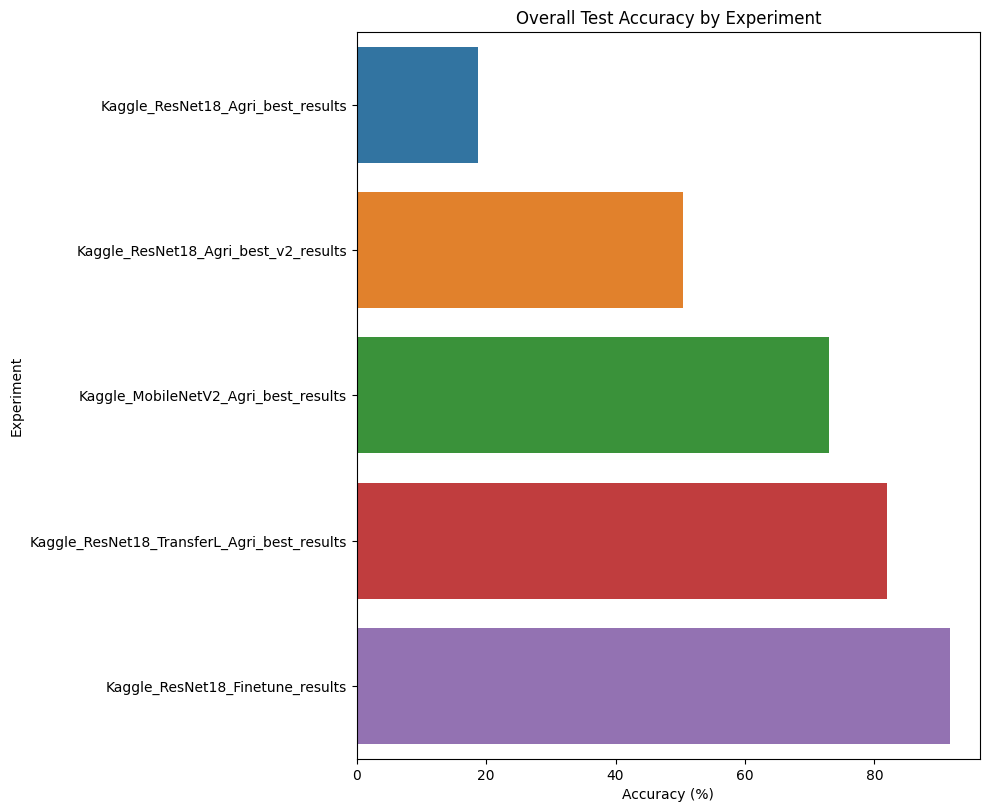

In [49]:
compare_runs("results", out_fig="results/summary_comparison.png")

In [50]:
def load_all_results(results_root: str) -> pd.DataFrame:
    """Load and combine all 'metrics_for_aggregation.csv' files."""
    csv_paths = list(Path(results_root).rglob("metrics_for_aggregation.csv"))
    if not csv_paths:
        raise FileNotFoundError(f"No 'metrics_for_aggregation.csv' files found in {results_root}")
    
    all_dfs = [pd.read_csv(p) for p in csv_paths]
    return pd.concat(all_dfs, ignore_index=True)

def plot_leaderboard(df: pd.DataFrame):
    """Plot a comprehensive leaderboard of model performance."""
    # Aggregate overall metrics. Need to get inference time and params too.
    # This assumes these values are available or can be added to the summary CSV.
    # For now, we focus on accuracy.
    overall_metrics = df.groupby('experiment')[['overall_accuracy', 'overall_accuracy_top5']].mean().reset_index()
    
    df_melted = overall_metrics.melt(
        id_vars='experiment', 
        value_vars=['overall_accuracy', 'overall_accuracy_top5'],
        var_name='Metric', 
        value_name='Accuracy'
    )
    df_melted['Metric'] = df_melted['Metric'].replace({
        'overall_accuracy': 'Top-1 Accuracy',
        'overall_accuracy_top5': 'Top-5 Accuracy'
    })
    
    print(df_melted)
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(12, 6))
    sns.barplot(data=df_melted, y='experiment', x='Accuracy', hue='Metric', ax=ax)
    
    ax.set_title('Model Performance Leaderboard', fontsize=16, weight='bold')
    ax.set_xlabel('Accuracy (%)', fontsize=12)
    ax.set_ylabel('Experiment', fontsize=12)
    ax.legend(title='Metric')
    
    # Add value labels to the bars
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f', fontsize=10, padding=3)
        
    plt.tight_layout()
    return fig

def plot_f1_heatmap(df: pd.DataFrame):
    """Plot a heatmap of per-class F1-scores across experiments."""
    f1_pivot = df.pivot_table(index='class_name', columns='experiment', values='f1')
    
    plt.style.use('default')
    fig, ax = plt.subplots(figsize=(14, 10))
    sns.heatmap(f1_pivot, annot=True, fmt=".2f", cmap="viridis", ax=ax, linewidths=.5)
    
    ax.set_title('Per-Class F1-Score Comparison', fontsize=16, weight='bold')
    ax.set_xlabel('Experiment', fontsize=12)
    ax.set_ylabel('Class', fontsize=12)
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)
    plt.tight_layout()
    return fig

def plot_hardest_classes(results_root: str, top_n: int = 5):
    """Identify and plot the classes with the most misclassifications for each model."""
    exp_dirs = [d for d in Path(results_root).iterdir() if d.is_dir()]
    
    fig, axes = plt.subplots(len(exp_dirs), 1, figsize=(12, len(exp_dirs) * 5), squeeze=False)
    axes = axes.flatten()

    for i, exp_dir in enumerate(exp_dirs):
        preds_path = exp_dir / "predictions.npy"
        labels_path = exp_dir / "labels.npy"
        metrics_path = exp_dir / "metrics_for_aggregation.csv"
        
        if not all([preds_path.exists(), labels_path.exists(), metrics_path.exists()]):
            continue
            
        preds = np.load(preds_path)
        labels = np.load(labels_path)
        class_names = pd.read_csv(metrics_path)['class_name'].unique()
        
        cm = confusion_matrix(labels, preds)
        # Errors are non-diagonal elements
        errors_per_class = cm.sum(axis=1) - np.diag(cm)
        
        hardest_indices = np.argsort(-errors_per_class)[:top_n]
        
        ax = axes[i]
        sns.barplot(x=[class_names[j] for j in hardest_indices], y=errors_per_class[hardest_indices], ax=ax, palette='Reds_r')
        ax.set_title(f"Top {top_n} Hardest Classes for: {exp_dir.name}", fontsize=14, weight='bold')
        ax.set_ylabel('Number of Misclassifications')
        ax.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    return fig

In [51]:
RESULTS_ROOT = "results" # Directory containing all your experiment folders
PLOTS_DIR = "final_plots"
os.makedirs(PLOTS_DIR, exist_ok=True)

# Load all data
all_data_df = load_all_results(RESULTS_ROOT)
all_data_df.head()

,experiment,class_idx,class_name,precision,recall,f1,support,overall_accuracy,overall_accuracy_top5,overall_loss
0,Kaggle_ResNet18_Agri_best_results,0,Corn___Common_Rust,0.123548,0.975000,0.219306,120,18.703428,59.314456,2.460901
1,Kaggle_ResNet18_Agri_best_results,1,Corn___Gray_Leaf_Spot,0.000000,0.000000,0.000000,52,18.703428,59.314456,2.460901
2,Kaggle_ResNet18_Agri_best_results,2,Corn___Healthy,0.125000,0.136752,0.130612,117,18.703428,59.314456,2.460901
3,Kaggle_ResNet18_Agri_best_results,3,Corn___Northern_Leaf_Blight,0.136842,0.131313,0.134021,99,18.703428,59.314456,2.460901
4,Kaggle_ResNet18_Agri_best_results,4,Potato___Early_Blight,0.000000,0.000000,0.000000,100,18.703428,59.314456,2.460901


                                    experiment          Metric   Accuracy
0         Kaggle_MobileNetV2_Agri_best_results  Top-1 Accuracy  73.025335
1            Kaggle_ResNet18_Agri_best_results  Top-1 Accuracy  18.703428
2         Kaggle_ResNet18_Agri_best_v2_results  Top-1 Accuracy  50.372578
3             Kaggle_ResNet18_Finetune_results  Top-1 Accuracy  91.728763
4  Kaggle_ResNet18_TransferL_Agri_best_results  Top-1 Accuracy  81.967213
5         Kaggle_MobileNetV2_Agri_best_results  Top-5 Accuracy  98.882265
6            Kaggle_ResNet18_Agri_best_results  Top-5 Accuracy  59.314456
7         Kaggle_ResNet18_Agri_best_v2_results  Top-5 Accuracy  88.673621
8             Kaggle_ResNet18_Finetune_results  Top-5 Accuracy  99.925484
9  Kaggle_ResNet18_TransferL_Agri_best_results  Top-5 Accuracy  99.850969
Saved leaderboard plot.


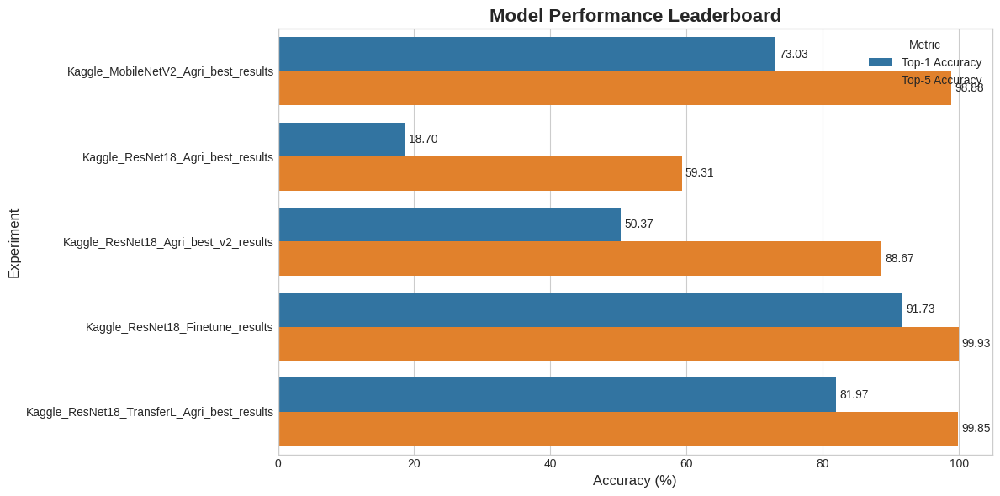

In [52]:
fig_leaderboard = plot_leaderboard(all_data_df)
fig_leaderboard.savefig(os.path.join(PLOTS_DIR, "leaderboard_comparison.png"), dpi=300)
print("Saved leaderboard plot.")

Saved F1-score heatmap.


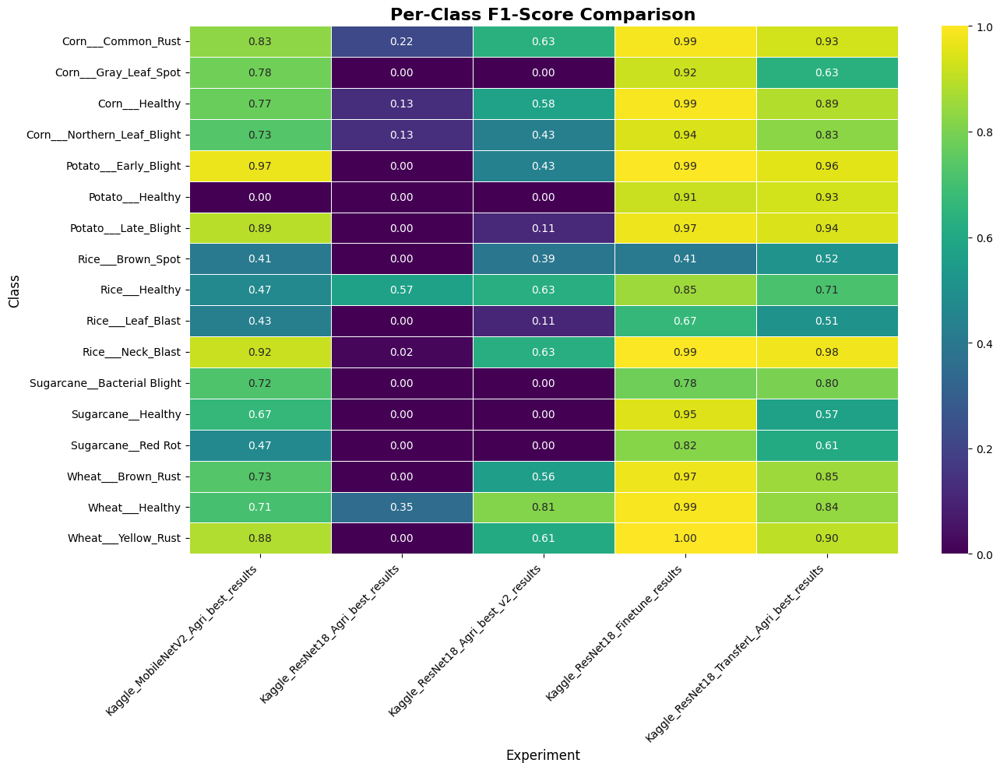

In [53]:
fig_f1_heatmap = plot_f1_heatmap(all_data_df)
fig_f1_heatmap.savefig(os.path.join(PLOTS_DIR, "2_f1_score_heatmap.png"), dpi=300)
print("Saved F1-score heatmap.")

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/usr/local/lib/python3.11/di

Saved hardest classes analysis.


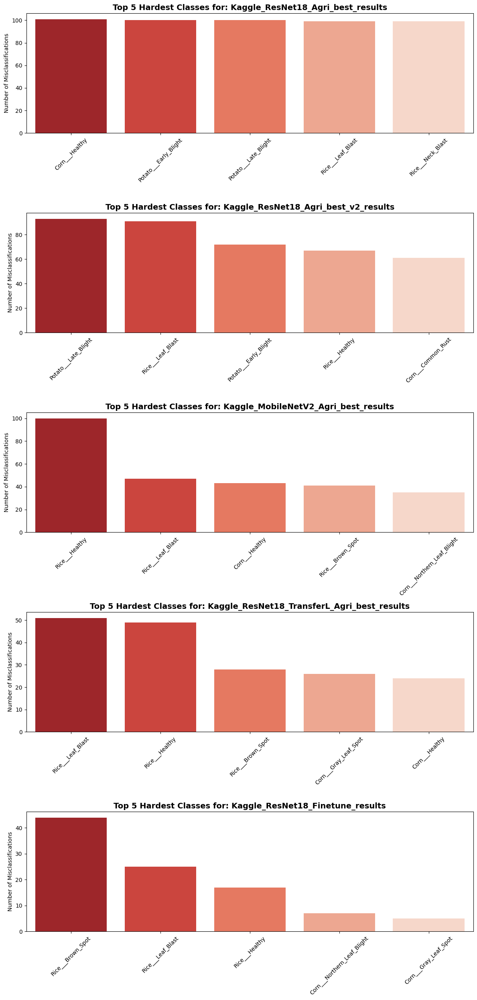

In [54]:
fig_hardest_classes = plot_hardest_classes(RESULTS_ROOT, top_n=5)
fig_hardest_classes.savefig(os.path.join(PLOTS_DIR, "3_hardest_classes_analysis.png"), dpi=300)
print("Saved hardest classes analysis.")